## 1. Import Basic Libraries and Dataset

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
import datetime as dt
import time
warnings.filterwarnings('ignore')

In [2]:
#Read the dataset into a dataframe
pd.set_option('display.max_columns',None)
df = pd.read_csv('weatherAUS.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


## 2. Data Cleaning and EDA

### 2.1 Data Preprocessing

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

Our Dataset consists of few catgorical features and majority of numerical features

In [4]:
#Firstly we'll extract the day, month and year values from Date column and then remove the Date column
df['Date'] = pd.to_datetime(df['Date'])
df['Day'] = df['Date'].dt.day
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year
df.drop('Date',axis=1,inplace=True)

In [5]:
#Also let's replace the Yes/No values in RainToday and RainTomorrow with 1/0
df['RainToday'].replace({'No':0,'Yes':1},inplace=True)
df['RainTomorrow'].replace({'No':0,'Yes':1},inplace=True)
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,0.0,0.0,1,12,2008
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,0.0,0.0,2,12,2008
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,0.0,0.0,3,12,2008
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,0.0,0.0,4,12,2008
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,5,12,2008


In [6]:
df.describe(include='all')

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
count,145460,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135134,135197.000000,134894,141232,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000,142199.000000,142193.000000,145460.000000,145460.000000,145460.000000
unique,49,NaN,NaN,NaN,NaN,NaN,16,NaN,16,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Canberra,NaN,NaN,NaN,NaN,NaN,W,NaN,N,SE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,3436,NaN,NaN,NaN,NaN,NaN,9915,NaN,11758,10838,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,12.194034,23.221348,2.360918,5.468232,7.611178,NaN,40.035230,NaN,NaN,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339,0.224193,0.224181,15.712258,6.399615,2012.769751
std,NaN,6.398495,7.119049,8.478060,4.193704,3.785483,NaN,13.607062,NaN,NaN,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665,0.417051,0.417043,8.794789,3.427262,2.537684
min,NaN,-8.500000,-4.800000,0.000000,0.000000,0.000000,NaN,6.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000,0.000000,0.000000,1.000000,1.000000,2007.000000
25%,NaN,7.600000,17.900000,0.000000,2.600000,4.800000,NaN,31.000000,NaN,NaN,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000,0.000000,0.000000,8.000000,3.000000,2011.000000
50%,NaN,12.000000,22.600000,0.000000,4.800000,8.400000,NaN,39.000000,NaN,NaN,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000,0.000000,0.000000,16.000000,6.000000,2013.000000
75%,NaN,16.900000,28.200000,0.800000,7.400000,10.600000,NaN,48.000000,NaN,NaN,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000,0.000000,0.000000,23.000000,9.000000,2015.000000


In [7]:
df.shape

(145460, 25)

### 2.2 Missing Data

In [8]:
#Let's look at the missing values in each feature
for feature in df.columns:
    print(feature,'has',df[feature].isnull().sum(),'missing values')

Location has 0 missing values
MinTemp has 1485 missing values
MaxTemp has 1261 missing values
Rainfall has 3261 missing values
Evaporation has 62790 missing values
Sunshine has 69835 missing values
WindGustDir has 10326 missing values
WindGustSpeed has 10263 missing values
WindDir9am has 10566 missing values
WindDir3pm has 4228 missing values
WindSpeed9am has 1767 missing values
WindSpeed3pm has 3062 missing values
Humidity9am has 2654 missing values
Humidity3pm has 4507 missing values
Pressure9am has 15065 missing values
Pressure3pm has 15028 missing values
Cloud9am has 55888 missing values
Cloud3pm has 59358 missing values
Temp9am has 1767 missing values
Temp3pm has 3609 missing values
RainToday has 3261 missing values
RainTomorrow has 3267 missing values
Day has 0 missing values
Month has 0 missing values
Year has 0 missing values


In [9]:
#Let's see the percentage of missing values in each feature
for feature in df.columns:
    print(feature,'has',df[feature].isnull().mean()*100,'% of missing values')

Location has 0.0 % of missing values
MinTemp has 1.0208992162793895 % of missing values
MaxTemp has 0.8669049910628353 % of missing values
Rainfall has 2.2418534304963567 % of missing values
Evaporation has 43.166506256015396 % of missing values
Sunshine has 48.00976213391998 % of missing values
WindGustDir has 7.098858792795271 % of missing values
WindGustSpeed has 7.055547916953114 % of missing values
WindDir9am has 7.263852605527293 % of missing values
WindDir3pm has 2.906641000962464 % of missing values
WindSpeed9am has 1.214766946239516 % of missing values
WindSpeed3pm has 2.105046060772721 % of missing values
Humidity9am has 1.8245565791282825 % of missing values
Humidity3pm has 3.09844630826344 % of missing values
Pressure9am has 10.356799120033 % of missing values
Pressure3pm has 10.331362573903478 % of missing values
Cloud9am has 38.42155919153032 % of missing values
Cloud3pm has 40.80709473394747 % of missing values
Temp9am has 1.214766946239516 % of missing values
Temp3pm ha

**Observations:** Our features have a lot of missing values. We'll either drop the entire columns or drop the missing records or use some imputation technique to handle the missing values.

### 2.3 Numerical Features

In [10]:
#Let's look at our numerical faetures in the dataset
num_features = [feature for feature in df.columns if df[feature].dtypes!='O']
print('Number of numerical features:',len(num_features))
print('Following are our numerical features:')
print(num_features)

Number of numerical features: 21
Following are our numerical features:
['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year']


In [11]:
df[num_features].head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,0.0,0.0,1,12,2008
1,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,0.0,0.0,2,12,2008
2,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,0.0,0.0,3,12,2008
3,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,0.0,0.0,4,12,2008
4,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,5,12,2008


0.0    110316
1.0     31877
Name: RainTomorrow, dtype: int64


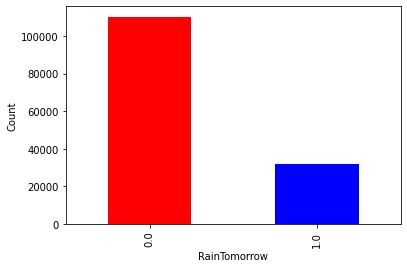

In [12]:
#First let's observe our target variable
print(df['RainTomorrow'].value_counts())
df['RainTomorrow'].value_counts().plot.bar(color=['red','blue'])
plt.xlabel('RainTomorrow')
plt.ylabel('Count')
plt.show()

We can see that Australia doesn't recieve much rainfall. Out of 142193 records, only 31877 times rain occured the next day that is approximately 20%

0.0    110319
1.0     31880
Name: RainToday, dtype: int64


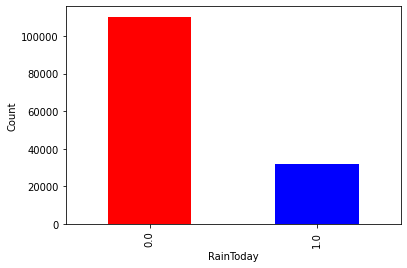

In [13]:
#Let's observe RainToday variable
print(df['RainToday'].value_counts())
df['RainToday'].value_counts().plot.bar(color=['red','blue'])
plt.xlabel('RainToday')
plt.ylabel('Count')
plt.show()

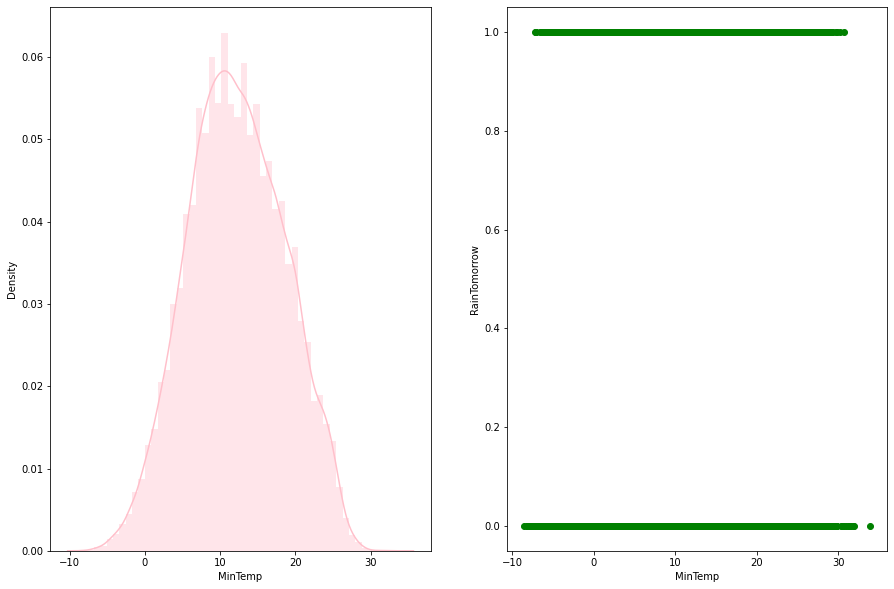

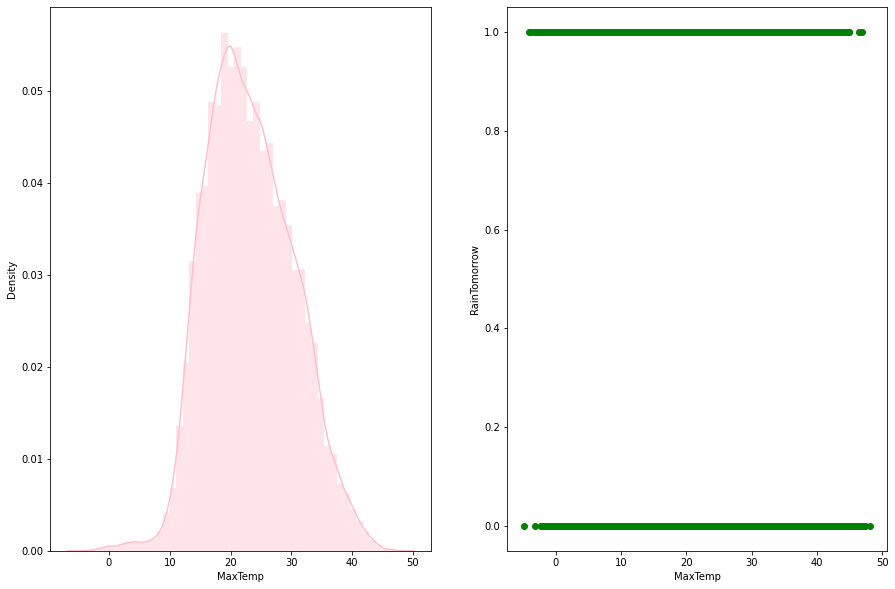

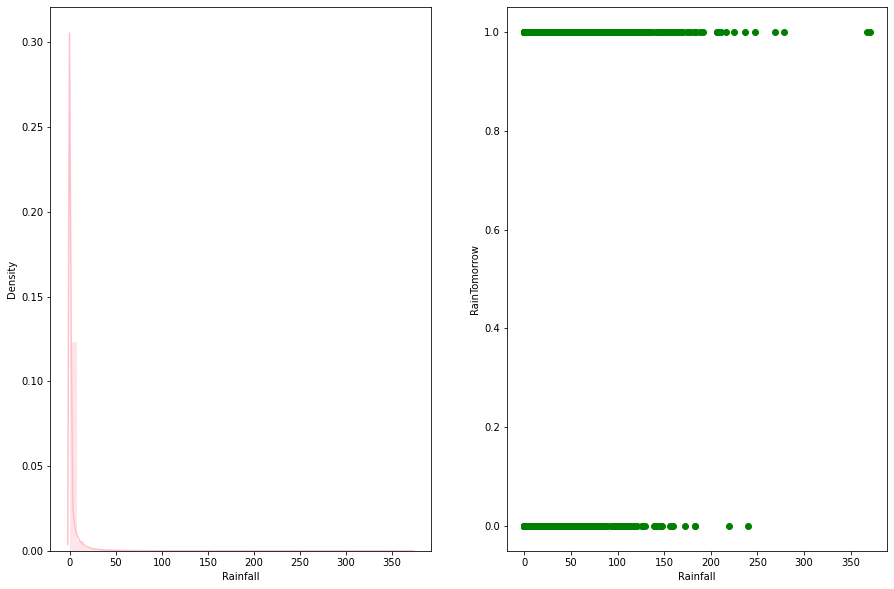

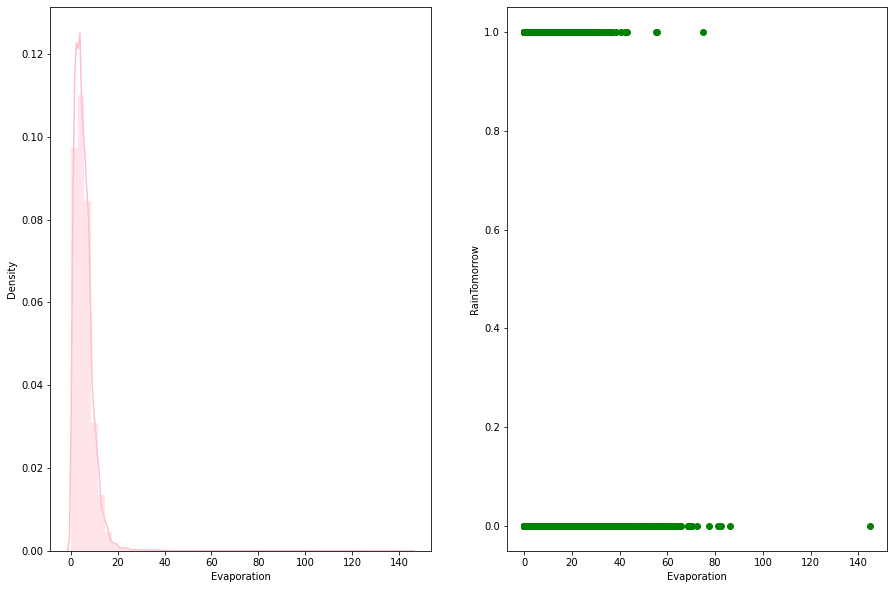

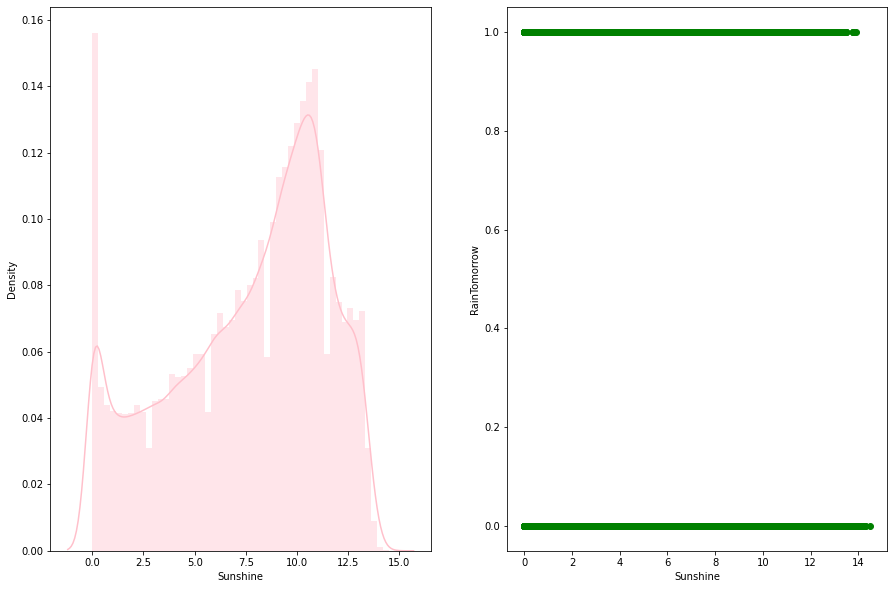

...

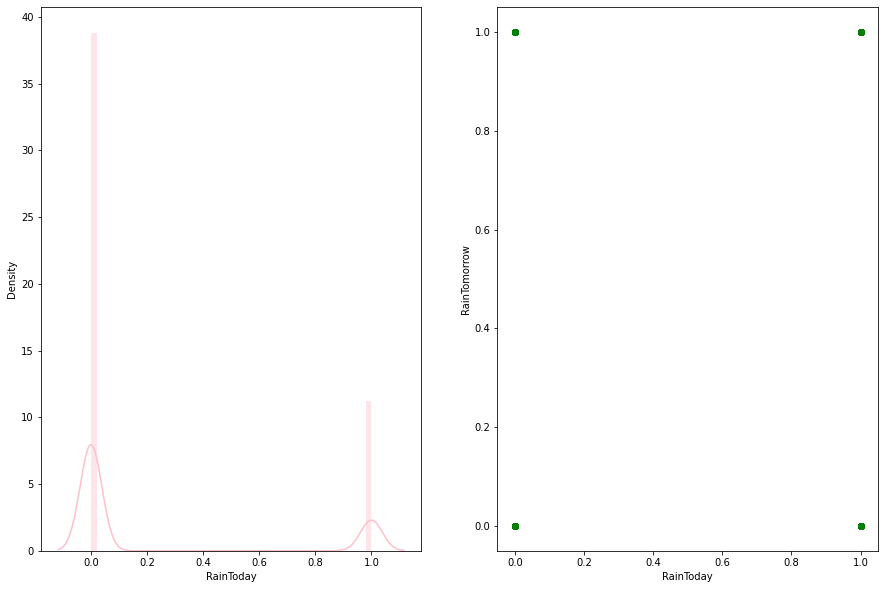

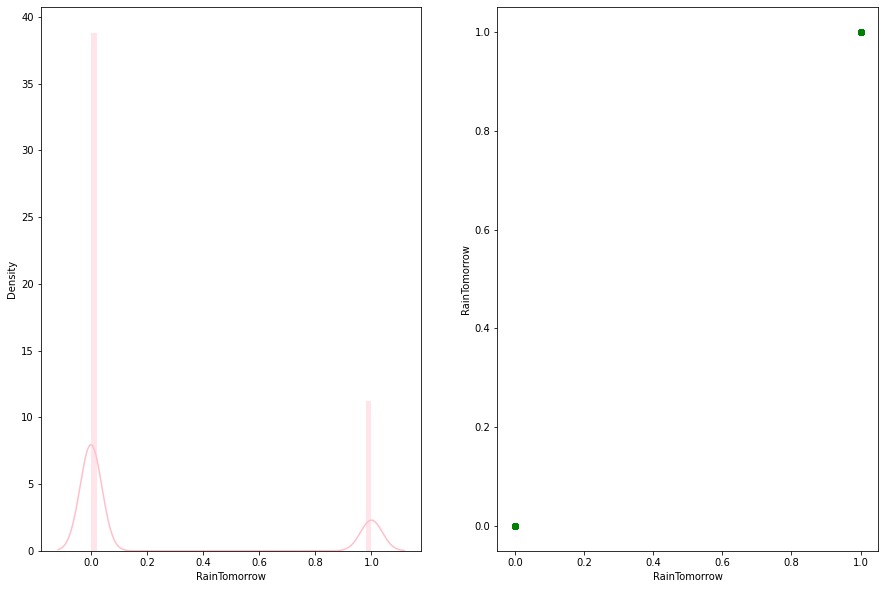

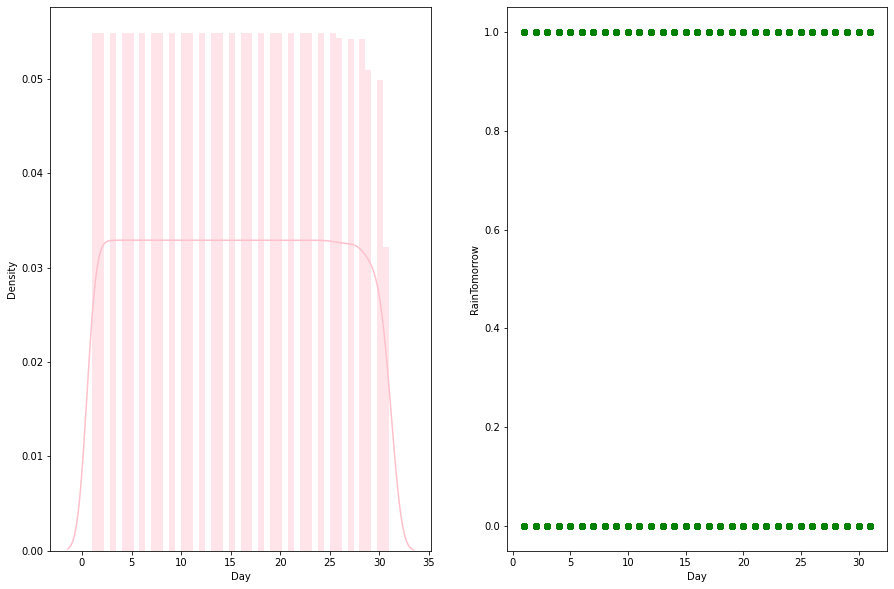

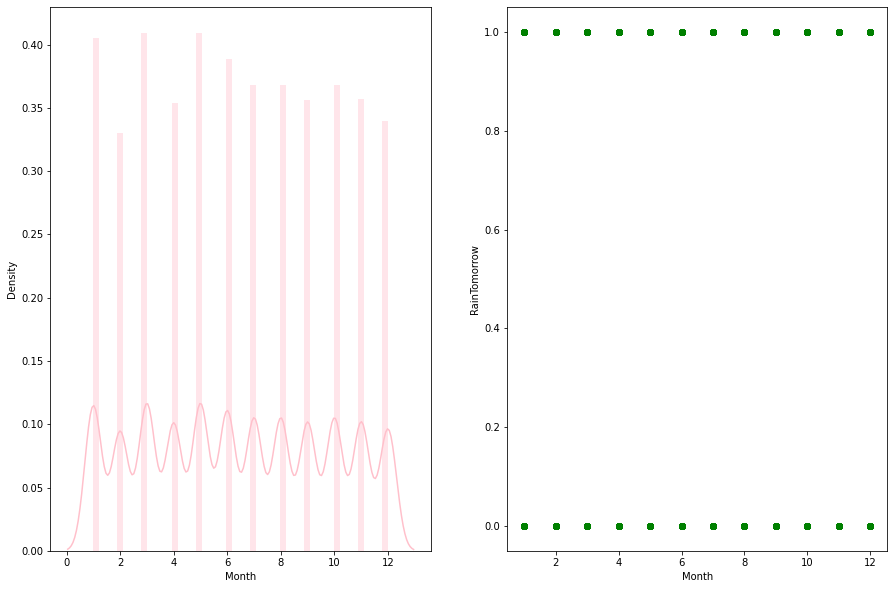

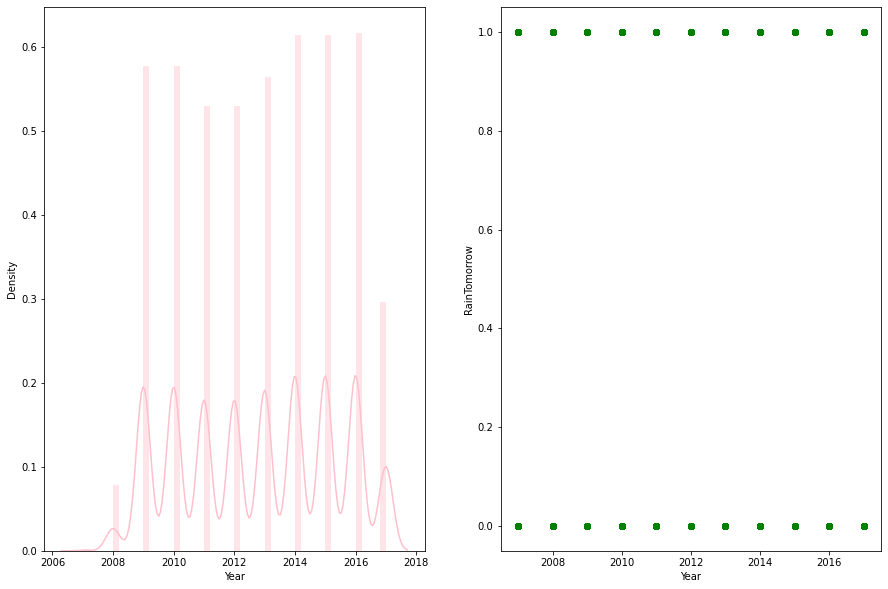

In [14]:
#let's see the distribution of these features and scatterplots with respect to target variable 'RainTomorrow'
for feature in num_features:
    plt.figure(figsize=(15,10))
    plt.subplot(1,2,1)
    sns.distplot(df[feature],color='pink')
    plt.xlabel(feature)
    plt.subplot(1,2,2)
    plt.scatter(df[feature],df['RainTomorrow'],color='green')
    plt.xlabel(feature)
    plt.ylabel('RainTomorrow')
    plt.show()

**Observations:** Some of the features follow gaussian distribution while some are skewed

### 2.4 Categorical Features

In [15]:
cat_features = [feature for feature in df.columns if df[feature].dtypes=='O']
print('Number of categorical features:',len(cat_features))
print('Following are our categorical features:')
print(cat_features)

Number of categorical features: 4
Following are our categorical features:
['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']


In [16]:
df[cat_features].head()

,Location,WindGustDir,WindDir9am,WindDir3pm
0,Albury,W,W,WNW
1,Albury,WNW,NNW,WSW
2,Albury,WSW,W,WSW
3,Albury,NE,SE,E
4,Albury,W,ENE,NW


In [17]:
#Let's see how many categories are present in each feature
for feature in cat_features:
    print(feature,'has:',len(df[feature].unique()),'categories')

Location has: 49 categories
WindGustDir has: 17 categories
WindDir9am has: 17 categories
WindDir3pm has: 17 categories


In [18]:
#Let's look at each category in the feature
for feature in cat_features:
    print(feature,':',df[feature].unique())

Location : ['Albury' 'BadgerysCreek' 'Cobar' 'CoffsHarbour' 'Moree' 'Newcastle'
 'NorahHead' 'NorfolkIsland' 'Penrith' 'Richmond' 'Sydney' 'SydneyAirport'
 'WaggaWagga' 'Williamtown' 'Wollongong' 'Canberra' 'Tuggeranong'
 'MountGinini' 'Ballarat' 'Bendigo' 'Sale' 'MelbourneAirport' 'Melbourne'
 'Mildura' 'Nhil' 'Portland' 'Watsonia' 'Dartmoor' 'Brisbane' 'Cairns'
 'GoldCoast' 'Townsville' 'Adelaide' 'MountGambier' 'Nuriootpa' 'Woomera'
 'Albany' 'Witchcliffe' 'PearceRAAF' 'PerthAirport' 'Perth' 'SalmonGums'
 'Walpole' 'Hobart' 'Launceston' 'AliceSprings' 'Darwin' 'Katherine'
 'Uluru']
WindGustDir : ['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' nan 'ENE' 'SSE' 'S' 'NW' 'SE'
 'ESE' 'E' 'SSW']
WindDir9am : ['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' nan 'SSW' 'N' 'WSW' 'ESE' 'E'
 'NW' 'WNW' 'NNE']
WindDir3pm : ['WNW' 'WSW' 'E' 'NW' 'W' 'SSE' 'ESE' 'ENE' 'NNW' 'SSW' 'SW' 'SE' 'N' 'S'
 'NNE' nan 'NE']


**Observations:** We have a lot of categories present in each feature. We'll have to come up with some encoding technique which we will do in Feature Engineering

In [19]:
for feature in cat_features:
    print(df[feature].value_counts())
    print('-----------------------------------')

Canberra            3436
Sydney              3344
Brisbane            3193
Hobart              3193
Darwin              3193
Perth               3193
Melbourne           3193
Adelaide            3193
Albury              3040
Launceston          3040
MountGambier        3040
MountGinini         3040
GoldCoast           3040
Townsville          3040
Wollongong          3040
AliceSprings        3040
Bendigo             3040
Ballarat            3040
Cairns              3040
Albany              3040
Newcastle           3039
Penrith             3039
Tuggeranong         3039
Richmond            3009
Williamtown         3009
Portland            3009
Nuriootpa           3009
BadgerysCreek       3009
Woomera             3009
Witchcliffe         3009
Cobar               3009
SydneyAirport       3009
Mildura             3009
PearceRAAF          3009
MelbourneAirport    3009
Sale                3009
Moree               3009
CoffsHarbour        3009
Dartmoor            3009
PerthAirport        3009


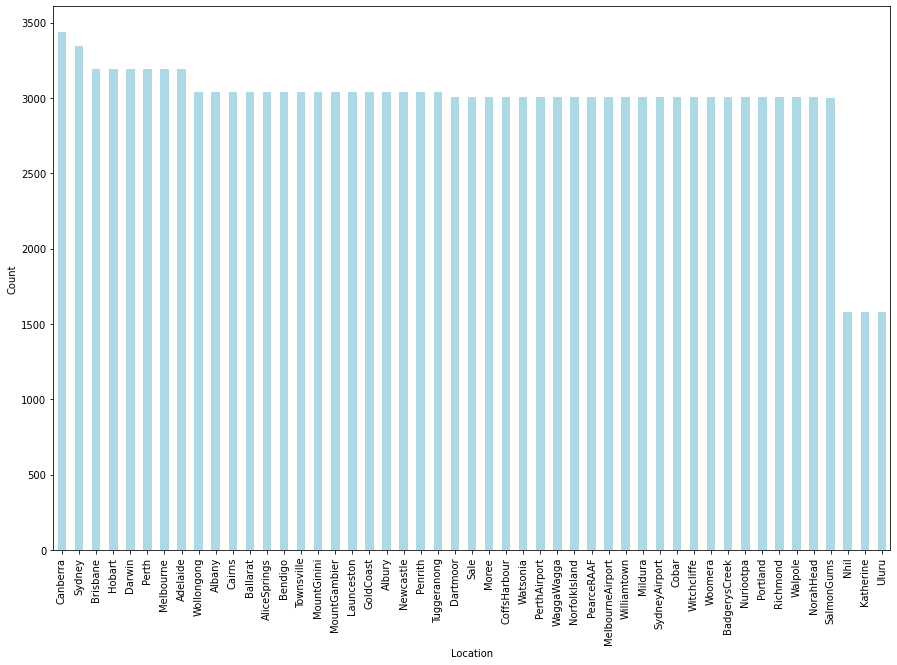

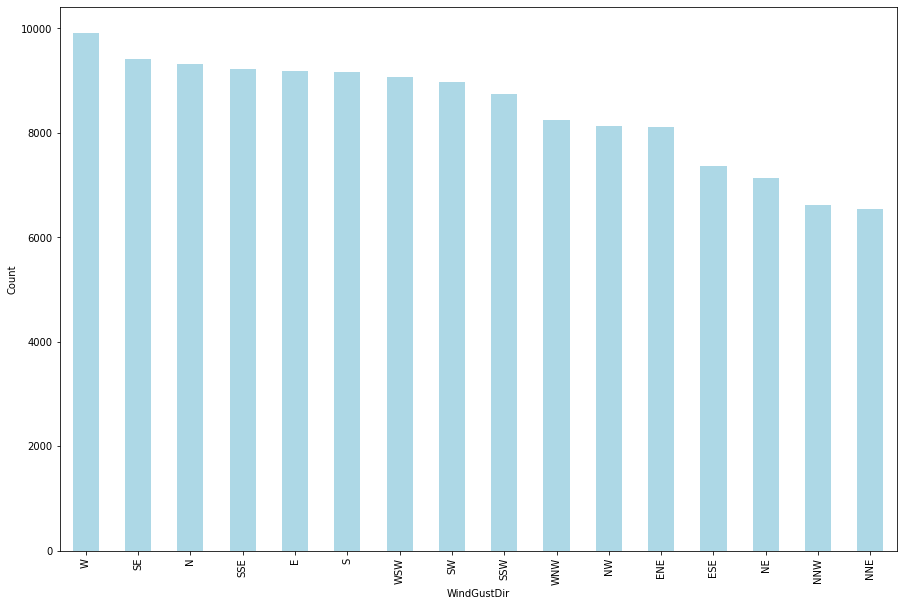

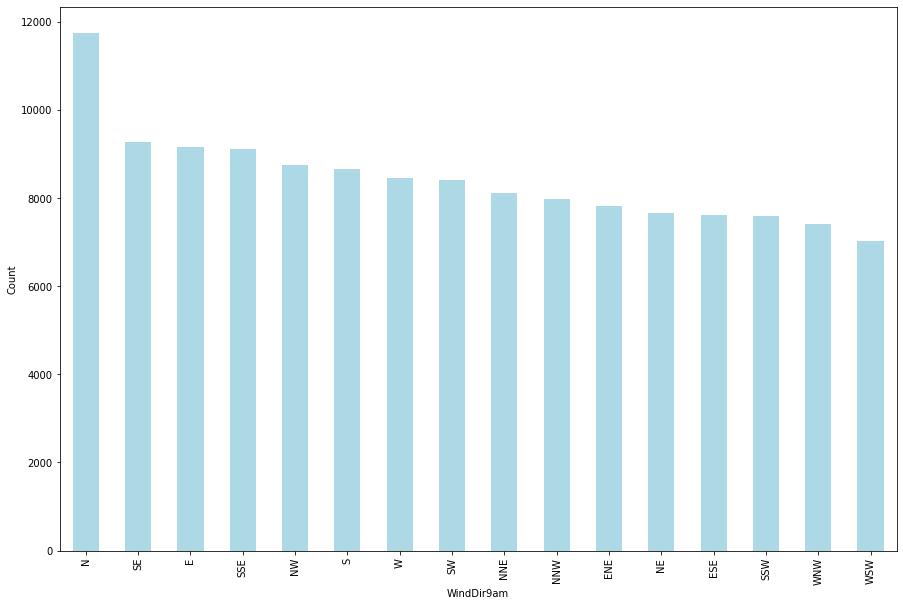

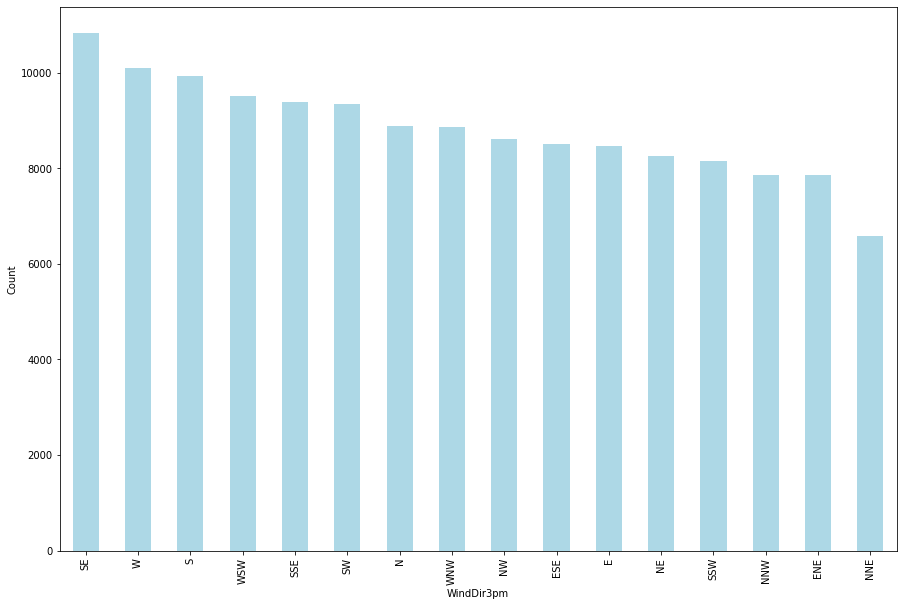

In [20]:
#Let's use barplots for a better visualization
for feature in cat_features:
    plt.figure(figsize=(15,10))
    df[feature].value_counts().sort_values(ascending=False).plot.bar(color='lightblue')
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.show()

**Observations:**
1. Weather Station in Canberra seems to have recorded the maximum amount of data
2. Most of the wind gust came from West direction
3. Wind direction at 9am were mostly to the north
4. Wind direction at 3pm were mostly south-eastern

### 2.5 Outlier Analysis

In [21]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000,142199.000000,142193.000000,145460.000000,145460.000000,145460.000000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339,0.224193,0.224181,15.712258,6.399615,2012.769751
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665,0.417051,0.417043,8.794789,3.427262,2.537684
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000,0.000000,0.000000,1.000000,1.000000,2007.000000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000,0.000000,0.000000,8.000000,3.000000,2011.000000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000,0.000000,0.000000,16.000000,6.000000,2013.000000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000,0.000000,0.000000,23.000000,9.000000,2015.000000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000,1.000000,1.000000,31.000000,12.000000,2017.000000


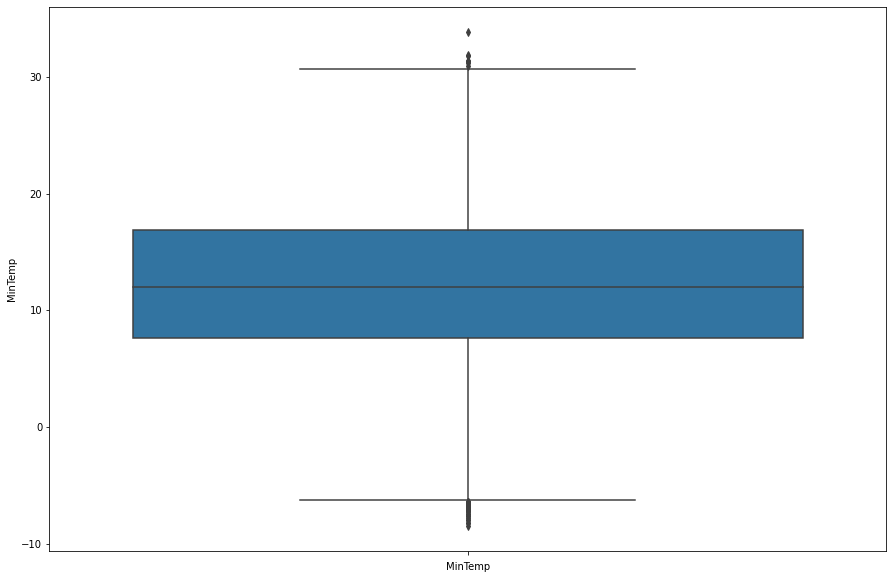

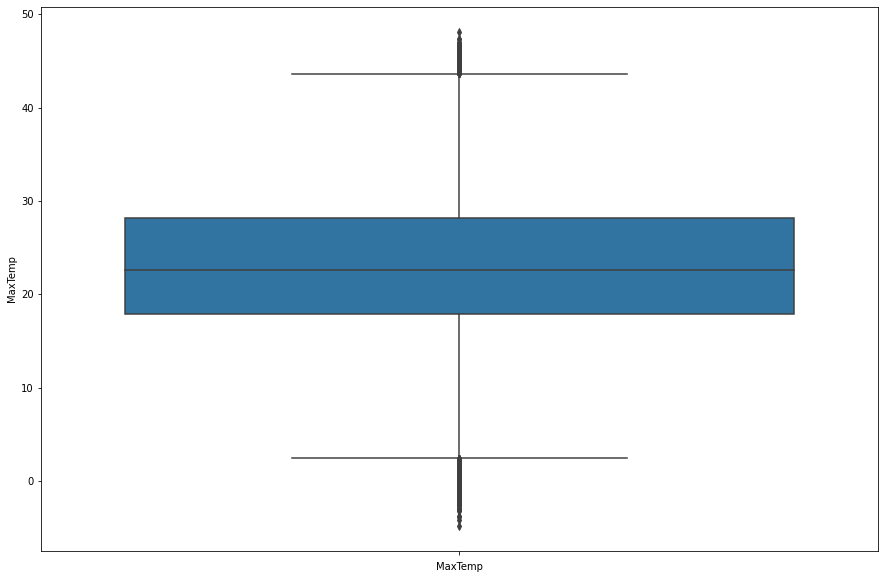

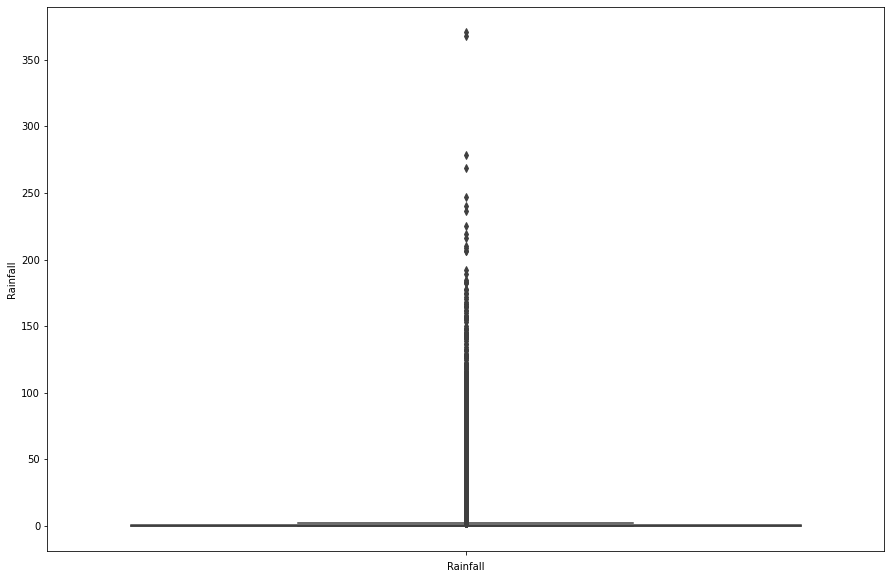

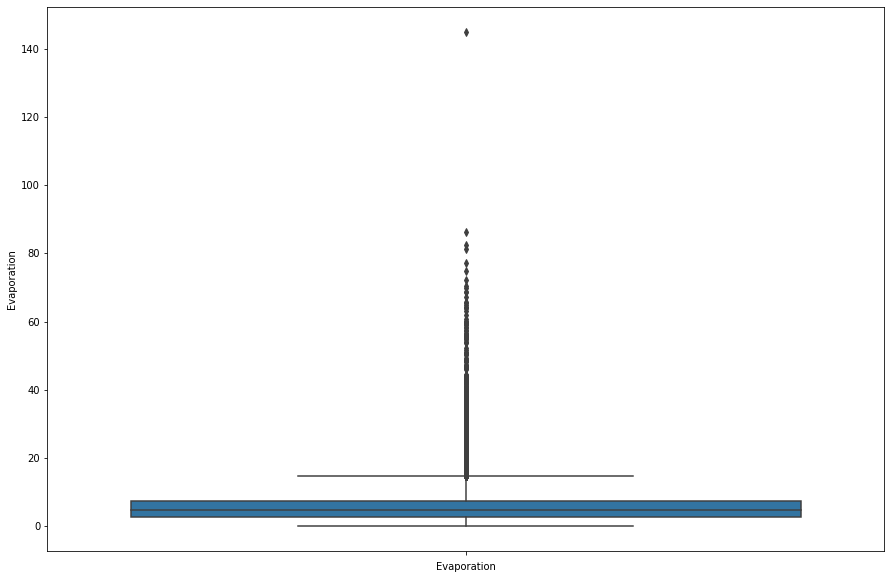

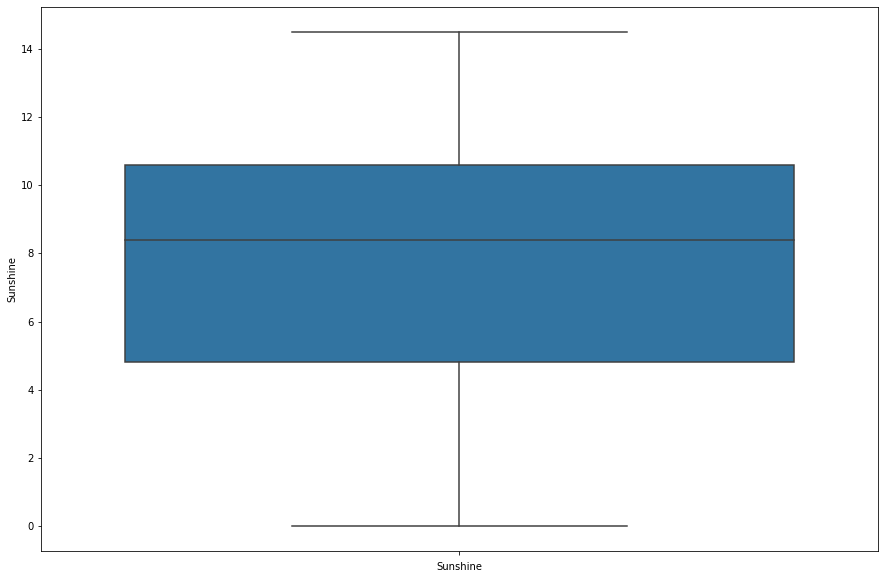

...

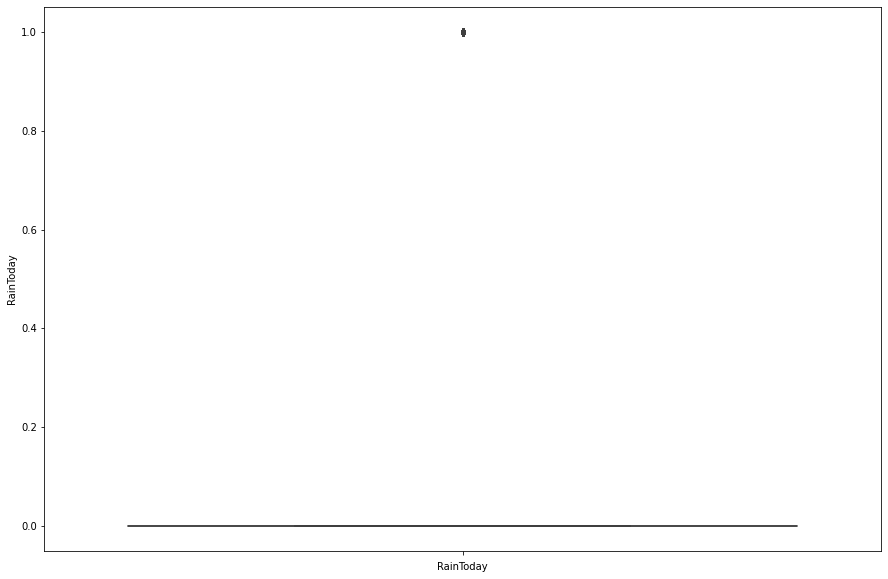

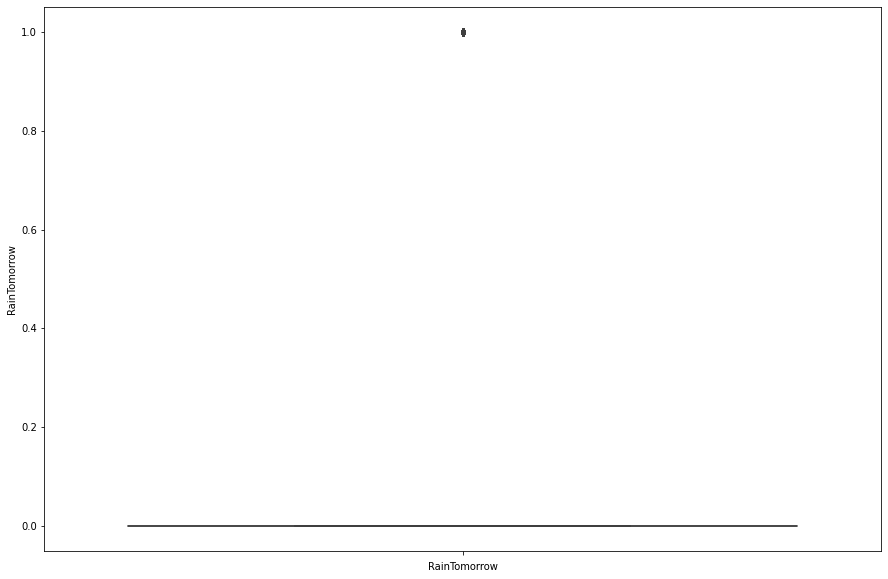

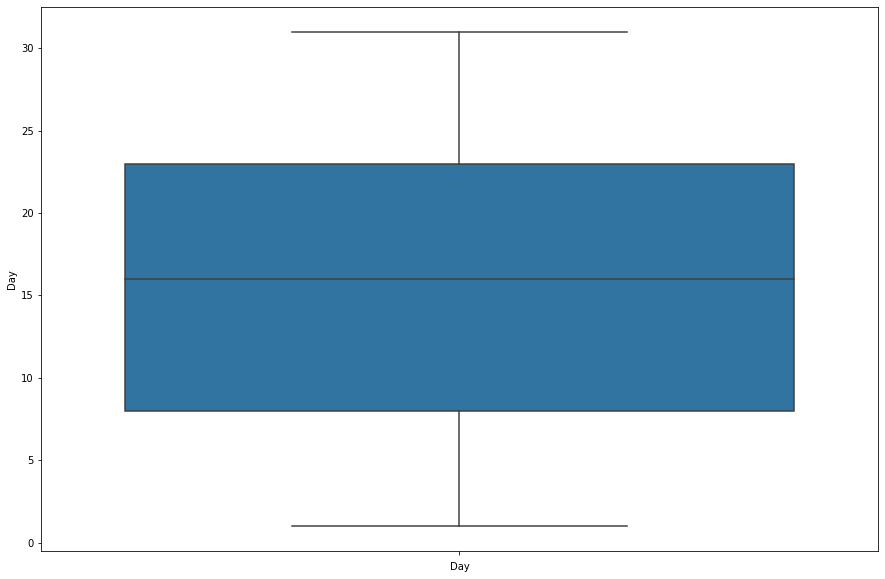

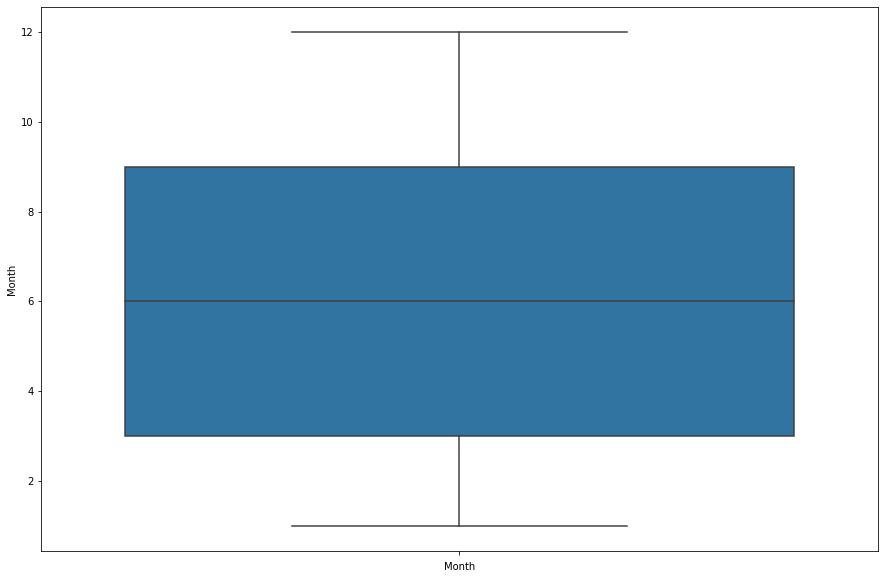

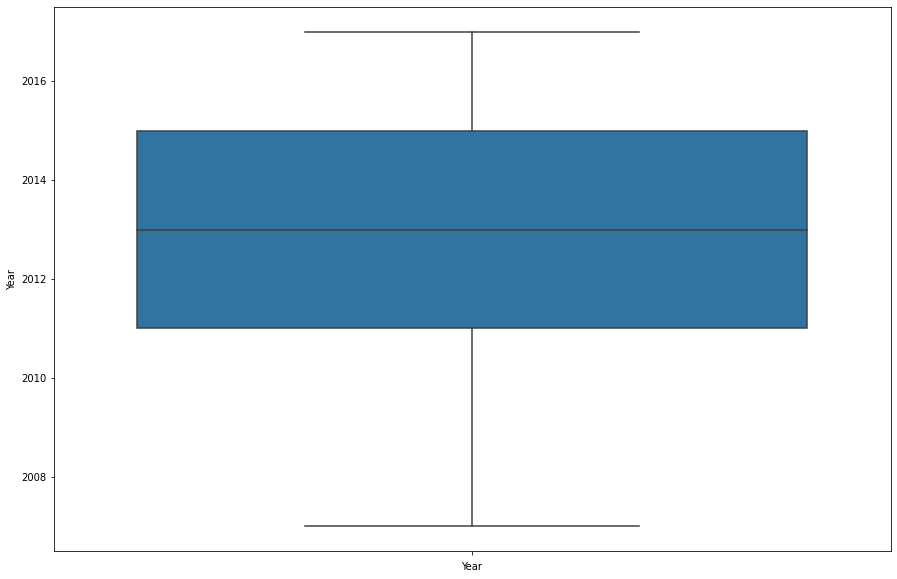

In [22]:
for feature in num_features:
    plt.figure(figsize=(15,10))
    sns.boxplot(y=df[feature])
    plt.xlabel(feature)
    plt.show()

We can see quite a lot of outliers are present in the dataset. Let's see them using IQR. Particularly Rainfall, Evaporation, WindSpeed9am and Windspeed3pm seem to have suspicious outliers.

In [23]:
features = ['Rainfall','Evaporation','WindSpeed9am','WindSpeed3pm']
for feature in features:
    IQR = df[feature].quantile(0.75) - df[feature].quantile(0.25)
    Lower_Bound = df[feature].quantile(0.25) - (3*IQR)
    Upper_Bound = df[feature].quantile(0.75) + (3*IQR)
    print(feature,'has outliers when',feature,'is less than {} and more than {}'.format(Lower_Bound,Upper_Bound))

Rainfall has outliers when Rainfall is less than -2.4000000000000004 and more than 3.2
Evaporation has outliers when Evaporation is less than -11.800000000000002 and more than 21.800000000000004
WindSpeed9am has outliers when WindSpeed9am is less than -29.0 and more than 55.0
WindSpeed3pm has outliers when WindSpeed3pm is less than -20.0 and more than 57.0


### 2.6 Multivariate Analysis

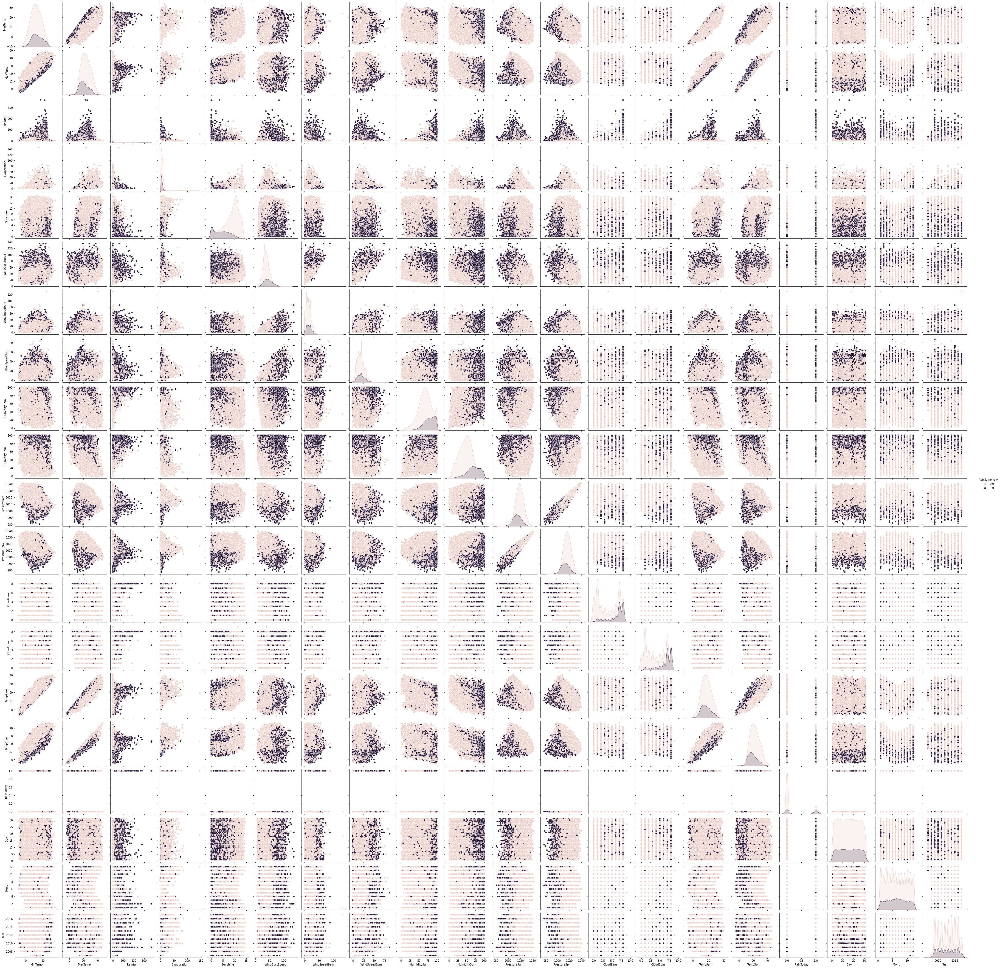

In [24]:
sns.pairplot(df,hue='RainTomorrow')
plt.show()

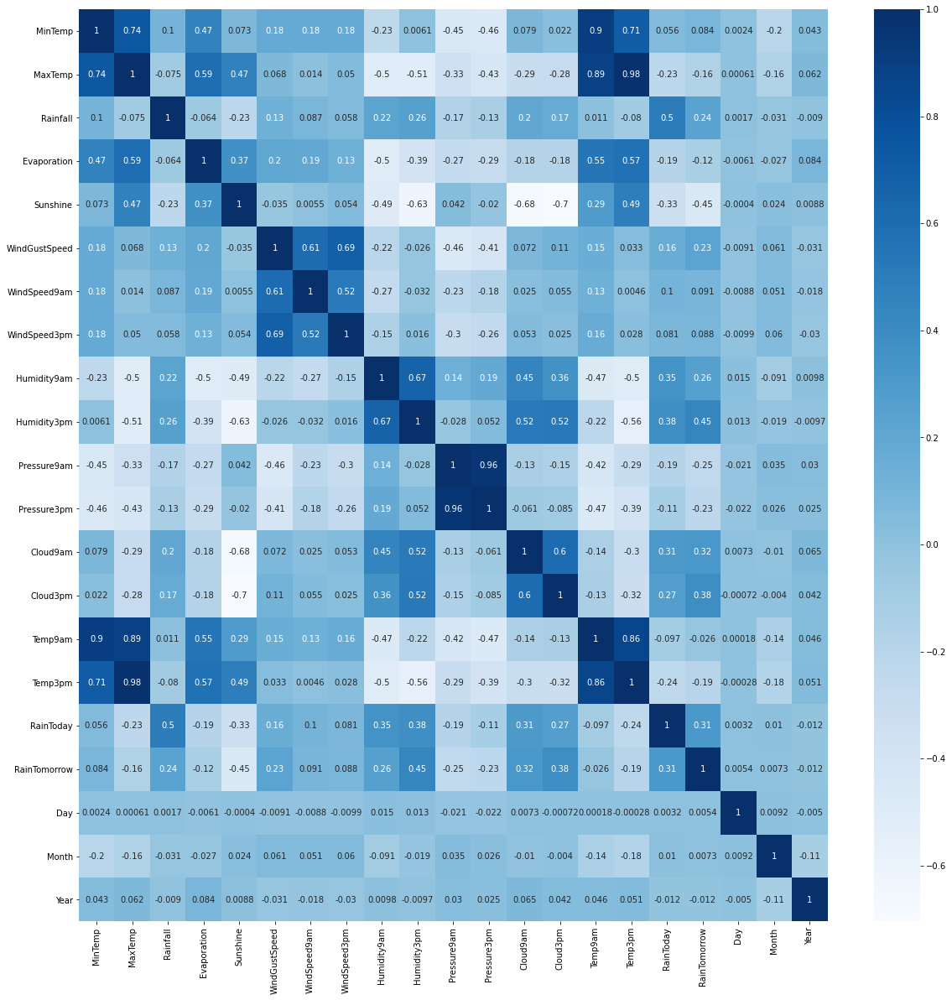

In [25]:
#Let's see the correlation among features using a heatmap
plt.figure(figsize=(20,20))
corr_matrix = df.corr()
sns.heatmap(corr_matrix,annot=True,cmap='Blues')
plt.show()

**Observations:** We can see that some of the features are highly correlated to each other. We can drop some of them as they would act as duplicates in our model.

In [26]:
#Let's write a function which will extract the highly correlated features (greater than 0.8).
#We can then remove either of the features from ith row or corresponding jth column
def correlation(dataset):
    col_corr = set()
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i,j])>0.8:
                col_name = corr_matrix.columns[i]
                col_corr.add(col_name)
    return col_corr

In [27]:
correlation(df)

{'Pressure3pm', 'Temp3pm', 'Temp9am'}

In [28]:
#Let's drop these 3 features as they don't seem to have much effect on our target variable and are highly correlated to each other
df.drop(columns=['Pressure3pm','Temp3pm','Temp9am'],inplace=True)
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,8.0,NaN,0.0,0.0,1,12,2008
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,NaN,NaN,0.0,0.0,2,12,2008
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,NaN,2.0,0.0,0.0,3,12,2008
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,NaN,NaN,0.0,0.0,4,12,2008
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,7.0,8.0,0.0,0.0,5,12,2008


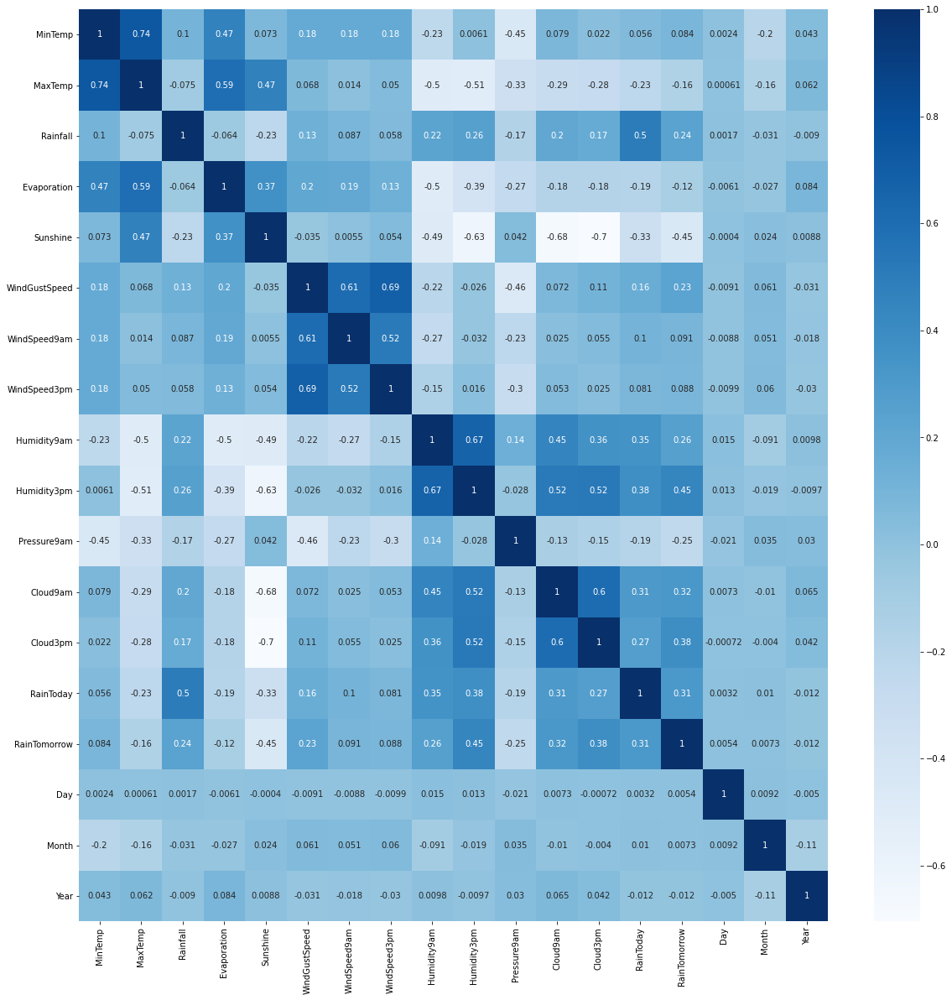

In [29]:
#Now let's see our heatmap
plt.figure(figsize=(20,20))
corr_matrix = df.corr()
sns.heatmap(corr_matrix,annot=True,cmap='Blues')
plt.show()

## 3. Feature Engineering

In [30]:
#Splitting the data into training and test set in order to avoid overfitting of data
X = df.drop('RainTomorrow',axis=1)
y = df['RainTomorrow']
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=0)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(116368, 21)
(29092, 21)
(116368,)
(29092,)


In [31]:
X_train.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,Day,Month,Year
22926,NorfolkIsland,18.8,23.7,0.2,5.0,7.3,ESE,52.0,ESE,ESE,31.0,28.0,74.0,73.0,1016.6,5.0,7.0,0.0,12,3,2014
80735,Watsonia,9.3,24.0,0.2,1.6,10.9,NE,48.0,NNW,NNE,13.0,24.0,74.0,55.0,1018.3,3.0,5.0,0.0,6,10,2016
121764,Perth,10.9,22.2,1.4,1.2,9.6,SW,26.0,NaN,SW,0.0,11.0,85.0,47.0,1017.6,1.0,2.0,1.0,31,8,2011
139821,Darwin,19.3,29.9,0.0,9.2,11.0,ESE,43.0,ESE,E,26.0,17.0,44.0,37.0,1015.9,1.0,1.0,0.0,11,6,2010
1867,Albury,15.7,17.6,12.4,NaN,NaN,E,20.0,ESE,E,11.0,13.0,100.0,100.0,1015.2,8.0,8.0,1.0,10,4,2014


In [32]:
X_test.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,Day,Month,Year
138175,AliceSprings,21.9,39.4,1.6,11.2,11.5,NNW,57.0,NE,N,20.0,33.0,50.0,26.0,1008.5,2.0,6.0,1.0,3,12,2014
38638,WaggaWagga,20.5,37.5,0.0,9.2,8.4,WNW,59.0,ENE,N,17.0,20.0,47.0,22.0,1012.9,4.0,7.0,0.0,8,1,2015
124058,SalmonGums,5.1,17.2,0.2,NaN,NaN,W,50.0,WNW,W,28.0,22.0,68.0,51.0,NaN,NaN,NaN,0.0,16,8,2009
99214,Adelaide,11.9,16.8,1.0,NaN,NaN,SW,28.0,WNW,SW,11.0,13.0,80.0,79.0,1018.5,NaN,NaN,0.0,31,8,2016
25097,Penrith,7.5,21.3,0.0,NaN,NaN,NE,15.0,SW,NNE,2.0,7.0,88.0,52.0,NaN,NaN,NaN,0.0,28,8,2011


In [33]:
y_train.head()

22926     1.0
80735     0.0
121764    0.0
139821    0.0
1867      1.0
Name: RainTomorrow, dtype: float64

In [34]:
y_test.head()

138175    1.0
38638     1.0
124058    0.0
99214     0.0
25097     0.0
Name: RainTomorrow, dtype: float64

### 3.1 Handling Missing Values in Numerical Features

In [35]:
#First let's fix the missing values in numerical features for the training data
#Assuming that the data is missing completely at random (MCAR) we'll use median imputation for features having outliers and mean imputation for features having few outliers
num_features = [feature for feature in X_train.columns if X_train[feature].dtypes!='O']
X_train[num_features].head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,Day,Month,Year
22926,18.8,23.7,0.2,5.0,7.3,52.0,31.0,28.0,74.0,73.0,1016.6,5.0,7.0,0.0,12,3,2014
80735,9.3,24.0,0.2,1.6,10.9,48.0,13.0,24.0,74.0,55.0,1018.3,3.0,5.0,0.0,6,10,2016
121764,10.9,22.2,1.4,1.2,9.6,26.0,0.0,11.0,85.0,47.0,1017.6,1.0,2.0,1.0,31,8,2011
139821,19.3,29.9,0.0,9.2,11.0,43.0,26.0,17.0,44.0,37.0,1015.9,1.0,1.0,0.0,11,6,2010
1867,15.7,17.6,12.4,NaN,NaN,20.0,11.0,13.0,100.0,100.0,1015.2,8.0,8.0,1.0,10,4,2014


In [36]:
X_train[num_features].isnull().sum()

MinTemp           1183
MaxTemp           1019
Rainfall          2617
Evaporation      50355
Sunshine         55899
WindGustSpeed     8218
WindSpeed9am      1409
WindSpeed3pm      2456
Humidity9am       2147
Humidity3pm       3598
Pressure9am      12091
Cloud9am         44796
Cloud3pm         47557
RainToday         2617
Day                  0
Month                0
Year                 0
dtype: int64

In [37]:
#MinTemp, MaxTemp, Rainfall, Evaporation, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Humidity9am and Pressure9am have some outliers present
#We'll use median imputation for these features
features = ['MinTemp','MaxTemp','Rainfall','Evaporation','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Pressure9am']
for feature in features:
    X_train[feature].fillna(X_train[feature].median(),inplace=True)

In [38]:
#Sunshine, Humidity3pm, Cloud9am and Cloud3pm don't have outliers. We'll impute the missing values with mean
features = ['Sunshine','Humidity3pm','Cloud9am','Cloud3pm']
for feature in features:
    X_train[feature].fillna(X_train[feature].mean(),inplace=True)

In [39]:
#For Raintoday we'll replace the missing values with mode i.e 0
X_train['RainToday'].fillna(X_train['RainToday'].mode()[0],inplace=True)

In [40]:
#Finally check for null values
X_train[num_features].isnull().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Cloud9am         0
Cloud3pm         0
RainToday        0
Day              0
Month            0
Year             0
dtype: int64

In [41]:
#Similarly for the test data
num_features = [feature for feature in X_test.columns if X_test[feature].dtypes!='O']
X_test[num_features].head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,Day,Month,Year
138175,21.9,39.4,1.6,11.2,11.5,57.0,20.0,33.0,50.0,26.0,1008.5,2.0,6.0,1.0,3,12,2014
38638,20.5,37.5,0.0,9.2,8.4,59.0,17.0,20.0,47.0,22.0,1012.9,4.0,7.0,0.0,8,1,2015
124058,5.1,17.2,0.2,NaN,NaN,50.0,28.0,22.0,68.0,51.0,NaN,NaN,NaN,0.0,16,8,2009
99214,11.9,16.8,1.0,NaN,NaN,28.0,11.0,13.0,80.0,79.0,1018.5,NaN,NaN,0.0,31,8,2016
25097,7.5,21.3,0.0,NaN,NaN,15.0,2.0,7.0,88.0,52.0,NaN,NaN,NaN,0.0,28,8,2011


In [42]:
X_test[num_features].isnull().sum()

MinTemp            302
MaxTemp            242
Rainfall           644
Evaporation      12435
Sunshine         13936
WindGustSpeed     2045
WindSpeed9am       358
WindSpeed3pm       606
Humidity9am        507
Humidity3pm        909
Pressure9am       2974
Cloud9am         11092
Cloud3pm         11801
RainToday          644
Day                  0
Month                0
Year                 0
dtype: int64

In [43]:
features = ['MinTemp','MaxTemp','Rainfall','Evaporation','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Pressure9am']
for feature in features:
    X_test[feature].fillna(X_test[feature].median(),inplace=True)

In [44]:
features = ['Sunshine','Humidity3pm','Cloud9am','Cloud3pm']
for feature in features:
    X_test[feature].fillna(X_test[feature].mean(),inplace=True)

In [45]:
X_test['RainToday'].fillna(X_test['RainToday'].mode()[0],inplace=True)
X_test[num_features].isnull().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Cloud9am         0
Cloud3pm         0
RainToday        0
Day              0
Month            0
Year             0
dtype: int64

### 3.2 Handling Missing Values in Categorical Features

In [46]:
#Now let's fix the missing values in categorical features for training data first
cat_features = [feature for feature in X_train.columns if X_train[feature].dtypes=='O']
X_train[cat_features].head()

,Location,WindGustDir,WindDir9am,WindDir3pm
22926,NorfolkIsland,ESE,ESE,ESE
80735,Watsonia,NE,NNW,NNE
121764,Perth,SW,NaN,SW
139821,Darwin,ESE,ESE,E
1867,Albury,E,ESE,E


In [47]:
X_train[cat_features].isnull().sum()

Location          0
WindGustDir    8270
WindDir9am     8448
WindDir3pm     3369
dtype: int64

In [48]:
#We'll simply replace the missing values by the most frequent category i.e mode
for feature in cat_features:
    X_train[feature].fillna(X_train[feature].mode()[0],inplace=True)

In [49]:
X_train[cat_features].isnull().sum()

Location       0
WindGustDir    0
WindDir9am     0
WindDir3pm     0
dtype: int64

In [50]:
#Similarly for the test data
cat_features = [feature for feature in X_test.columns if X_test[feature].dtypes=='O']
X_test[cat_features].head()

,Location,WindGustDir,WindDir9am,WindDir3pm
138175,AliceSprings,NNW,NE,N
38638,WaggaWagga,WNW,ENE,N
124058,SalmonGums,W,WNW,W
99214,Adelaide,SW,WNW,SW
25097,Penrith,NE,SW,NNE


In [51]:
X_test[cat_features].isnull().sum()

Location          0
WindGustDir    2056
WindDir9am     2118
WindDir3pm      859
dtype: int64

In [52]:
for feature in cat_features:
    X_test[feature].fillna(X_test[feature].mode()[0],inplace=True)

In [53]:
X_test[cat_features].isnull().sum()

Location       0
WindGustDir    0
WindDir9am     0
WindDir3pm     0
dtype: int64

### 3.3 Handling Outliers in Numerical Features

In [54]:
#To take care of outliers we'll implement top-coding method and cap the maximum values to neglect the affect of outliers
#I took this peice of code from this kaggle notebook: https://www.kaggle.com/prashant111/extensive-analysis-eda-fe-modelling
def maximum_value(df,feature,max_value): #We've discovered max_value to be considered as an outlier in the above outlier analysis
    return np.where(df[feature]>max_value,max_value,df[feature]) #Wherever the datapoint is greater than max_value replace it with max_value else leave it be
for dataframe in [X_train,X_test]:
    dataframe['Rainfall'] = maximum_value(dataframe,'Rainfall',3.2)
    dataframe['Evaporation'] = maximum_value(dataframe,'Evaporation',21.8)
    dataframe['WindSpeed9am'] = maximum_value(dataframe,'WindSpeed9am',55.0)
    dataframe['WindSpeed3pm'] = maximum_value(dataframe,'WindSpeed3pm',57.0)

In [55]:
#Now we can see that the maximum values are capped!
X_train.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,Day,Month,Year
count,116368.000000,116368.000000,116368.000000,116368.000000,116368.000000,116368.000000,116368.000000,116368.000000,116368.000000,116368.000000,116368.000000,116368.000000,116368.000000,116368.000000,116368.000000,116368.000000,116368.000000
mean,12.190189,23.203107,0.670800,5.093362,7.596507,39.982091,14.029381,18.687466,68.950691,51.593252,1017.639891,4.453851,4.510805,0.219648,15.731954,6.395091,2012.767058
std,6.366893,7.085408,1.181512,2.800200,2.732307,13.127953,8.835596,8.700618,18.811437,20.439877,6.728234,2.265151,2.092264,0.414010,8.796931,3.425451,2.538401
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,0.000000,0.000000,0.000000,1.000000,1.000000,2007.000000
25%,7.700000,18.000000,0.000000,4.000000,7.596507,31.000000,7.000000,13.000000,57.000000,37.000000,1013.500000,3.000000,4.000000,0.000000,8.000000,3.000000,2011.000000
50%,12.000000,22.600000,0.000000,4.700000,7.596507,39.000000,13.000000,19.000000,70.000000,51.593252,1017.600000,4.453851,4.510805,0.000000,16.000000,6.000000,2013.000000
75%,16.800000,28.200000,0.600000,5.200000,8.600000,46.000000,19.000000,24.000000,83.000000,65.000000,1021.800000,6.000000,6.000000,0.000000,23.000000,9.000000,2015.000000
max,31.900000,48.100000,3.200000,21.800000,14.500000,135.000000,55.000000,57.000000,100.000000,100.000000,1041.000000,9.000000,8.000000,1.000000,31.000000,12.000000,2017.000000


In [56]:
X_test.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,Day,Month,Year
count,29092.000000,29092.000000,29092.000000,29092.000000,29092.000000,29092.000000,29092.000000,29092.000000,29092.000000,29092.000000,29092.000000,29092.000000,29092.000000,29092.000000,29092.000000,29092.000000,29092.000000
mean,12.199512,23.268211,0.663151,5.165066,7.669708,39.882579,14.013474,18.537742,68.703492,51.322499,1017.664275,4.422056,4.506448,0.217242,15.633473,6.417709,2012.780524
std,6.361430,7.099962,1.177572,2.845955,2.717809,13.092727,8.835848,8.684248,19.029080,20.594936,6.729566,2.267346,2.095746,0.412376,8.785922,3.434493,2.534826
min,-7.000000,-3.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,1.000000,1.000000,983.700000,0.000000,0.000000,0.000000,1.000000,1.000000,2007.000000
25%,7.600000,18.000000,0.000000,4.200000,7.669708,31.000000,7.000000,13.000000,57.000000,37.000000,1013.600000,3.000000,4.000000,0.000000,8.000000,3.000000,2011.000000
50%,12.000000,22.700000,0.000000,4.800000,7.669708,39.000000,13.000000,17.000000,70.000000,51.322499,1017.600000,4.422056,4.506448,0.000000,16.000000,6.000000,2013.000000
75%,16.800000,28.200000,0.600000,5.400000,8.700000,46.000000,19.000000,24.000000,83.000000,65.000000,1021.800000,6.000000,6.000000,0.000000,23.000000,9.000000,2015.000000
max,33.900000,46.700000,3.200000,21.800000,14.300000,126.000000,55.000000,57.000000,100.000000,100.000000,1040.400000,8.000000,9.000000,1.000000,31.000000,12.000000,2017.000000


### 3.4 Encoding Categorical Features

In [57]:
#We need to encode our categorical features before feeding them into the model.
#We will use OneHotEncoding since all our categorical features are nominal. Although LabelEncoding could be implemented to minimize feature space
Location = X_train[['Location']]
Location = pd.get_dummies(Location,drop_first=True)
WindGustDir = X_train[['WindGustDir']]
WindGustDir = pd.get_dummies(WindGustDir,drop_first=True)
WindDir9am = X_train[['WindDir9am']]
WindDir9am = pd.get_dummies(WindDir9am,drop_first=True)
WindDir3pm = X_train[['WindDir3pm']]
WindDir3pm = pd.get_dummies(WindDir3pm,drop_first=True)
X_train = pd.concat([X_train,Location,WindGustDir,WindDir9am,WindDir3pm],axis=1)

In [58]:
#Now we can drop the original categorical features
X_train.drop(columns=['Location','WindGustDir','WindDir9am','WindDir3pm'],axis=1,inplace=True)
X_train.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,Day,Month,Year,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
22926,18.8,23.7,0.2,5.0,7.300000,52.0,31.0,28.0,74.0,73.0,1016.6,5.0,7.0,0.0,12,3,2014,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
80735,9.3,24.0,0.2,1.6,10.900000,48.0,13.0,24.0,74.0,55.0,1018.3,3.0,5.0,0.0,6,10,2016,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
121764,10.9,22.2,1.4,1.2,9.600000,26.0,0.0,11.0,85.0,47.0,1017.6,1.0,2.0,1.0,31,8,2011,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
139821,19.3,29.9,0.0,9.2,11.000000,43.0,26.0,17.0,44.0,37.0,1015.9,1.0,1.0,0.0,11,6,2010,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1867,15.7,17.6,3.2,4.7,7.596507,20.0,11.0,13.0,100.0,100.0,1015.2,8.0,8.0,1.0,10,4,2014,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [59]:
#Similarly for the test data
Location1 = X_test[['Location']]
Location1 = pd.get_dummies(Location1,drop_first=True)
WindGustDir1 = X_test[['WindGustDir']]
WindGustDir1 = pd.get_dummies(WindGustDir1,drop_first=True)
WindDir9am1 = X_test[['WindDir9am']]
WindDir9am1 = pd.get_dummies(WindDir9am1,drop_first=True)
WindDir3pm1 = X_test[['WindDir3pm']]
WindDir3pm1 = pd.get_dummies(WindDir3pm1,drop_first=True)
X_test = pd.concat([X_test,Location1,WindGustDir1,WindDir9am1,WindDir3pm1],axis=1)

In [60]:
X_test.drop(columns=['Location','WindGustDir','WindDir9am','WindDir3pm'],axis=1,inplace=True)
X_test.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,Day,Month,Year,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
138175,21.9,39.4,1.6,11.2,11.500000,57.0,20.0,33.0,50.0,26.0,1008.5,2.000000,6.000000,1.0,3,12,2014,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
38638,20.5,37.5,0.0,9.2,8.400000,59.0,17.0,20.0,47.0,22.0,1012.9,4.000000,7.000000,0.0,8,1,2015,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
124058,5.1,17.2,0.2,4.8,7.669708,50.0,28.0,22.0,68.0,51.0,1017.6,4.422056,4.506448,0.0,16,8,2009,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
99214,11.9,16.8,1.0,4.8,7.669708,28.0,11.0,13.0,80.0,79.0,1018.5,4.422056,4.506448,0.0,31,8,2016,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
25097,7.5,21.3,0.0,4.8,7.669708,15.0,2.0,7.0,88.0,52.0,1017.6,4.422056,4.506448,0.0,28,8,2011,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


We haven't treated the missing values in our target variable 'RainTomorrow'. Let's quickly impute the missing values with the mode i.e 0

In [61]:
y_train.isnull().sum()

2623

In [62]:
y_train.fillna(y_train.mode()[0],inplace=True)
y_train.isnull().sum()

0

In [63]:
#Similarly for the test data
y_test.isnull().sum()

644

In [64]:
y_test.fillna(y_test.mode()[0],inplace=True)
y_test.isnull().sum()

0

Now our dataset is ready for modelling but before that we need to scale the features using either StandardScaler or MinMaxScaler as we will be implementing some ML algorithms which rely on Euclidean Distance!

### 3.5 Feature Scaling

The Ensemble techniques such as RandomForest and XgBoost don't require feature scaling, threfore we'll make a copy of X_train and X_test for those 2 ML algorithms.

In [65]:
X_train_ensemble = X_train.copy()
X_test_ensemble = X_test.copy()

In [66]:
from sklearn.preprocessing import MinMaxScaler
col_names_train = X_train.columns
col_names_test = X_test.columns
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

In [67]:
X_train = pd.DataFrame(X_train,columns=col_names_train)
X_train.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,Day,Month,Year,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,0.675743,0.538752,0.0625,0.229358,0.503448,0.356589,0.563636,0.491228,0.74,0.73,0.596694,0.555556,0.875,0.0,0.366667,0.181818,0.7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.440594,0.544423,0.0625,0.073394,0.751724,0.325581,0.236364,0.421053,0.74,0.55,0.624793,0.333333,0.625,0.0,0.166667,0.818182,0.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.480198,0.510397,0.4375,0.055046,0.662069,0.155039,0.000000,0.192982,0.85,0.47,0.613223,0.111111,0.250,1.0,1.000000,0.636364,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.688119,0.655955,0.0000,0.422018,0.758621,0.286822,0.472727,0.298246,0.44,0.37,0.585124,0.111111,0.125,0.0,0.333333,0.454545,0.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.599010,0.423440,1.0000,0.215596,0.523897,0.108527,0.200000,0.228070,1.00,1.00,0.573554,0.888889,1.000,1.0,0.300000,0.272727,0.7,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

In [68]:
X_test = pd.DataFrame(X_test,columns=col_names_test)
X_test.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Cloud9am,Cloud3pm,RainToday,Day,Month,Year,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,0.706601,0.853707,0.5000,0.513761,0.804196,0.420168,0.363636,0.578947,0.494949,0.252525,0.437390,0.250000,0.666667,1.0,0.066667,1.000000,0.7,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.672372,0.815631,0.0000,0.422018,0.587413,0.436975,0.309091,0.350877,0.464646,0.212121,0.514991,0.500000,0.777778,0.0,0.233333,0.000000,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.295844,0.408818,0.0625,0.220183,0.536343,0.361345,0.509091,0.385965,0.676768,0.505051,0.597884,0.552757,0.500716,0.0,0.500000,0.636364,0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.462103,0.400802,0.3125,0.220183,0.536343,0.176471,0.200000,0.228070,0.797980,0.787879,0.613757,0.552757,0.500716,0.0,1.000000,0.636364,0.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.354523,0.490982,0.0000,0.220183,0.536343,0.067227,0.036364,0.122807,0.878788,0.515152,0.597884,0.552757,0.500716,0.0,0.900000,0.636364,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

## 4. Model Building

### 4.1 Logistic Regression

In [69]:
from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression(solver='liblinear',random_state=0)
log_reg.fit(X_train,y_train)
y_pred_log_reg = log_reg.predict(X_test)

In [70]:
y_pred_log_reg

array([0., 0., 0., ..., 1., 0., 0.])

In [71]:
#Check the probability of getting 1's or 0's
log_reg.predict_proba(X_test)[:,0]

array([0.81237435, 0.81326657, 0.80929277, ..., 0.49140638, 0.63585393,
       0.97300688])

In [72]:
log_reg.predict_proba(X_test)[:,1]

array([0.18762565, 0.18673343, 0.19070723, ..., 0.50859362, 0.36414607,
       0.02699312])

In [73]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
accuracies = cross_val_score(log_reg,X_test,y_test,cv=10,scoring='accuracy')
print(accuracies)

[0.84501718 0.84261168 0.84530767 0.84015125 0.84599519 0.85149536
 0.85046408 0.8353386  0.84599519 0.85390168]


In [74]:
accuracy_score(y_test,y_pred_log_reg)

0.8458682799395023

In [75]:
print('Logistic Regression has a mean test accuracy of:',np.mean(accuracies)*100)

Logistic Regression has a mean test accuracy of: 84.56277886261265


In [76]:
#Check the accuracy of training data
accuracies = cross_val_score(log_reg,X_train,y_train,cv=10,scoring='accuracy')
print(accuracies)

[0.84867234 0.84575062 0.84660995 0.84652402 0.8501332  0.84497723
 0.8381026  0.84583656 0.84891715 0.84711241]


In [77]:
print('Logistic Regression has a mean training accuracy of:',np.mean(accuracies)*100)

Logistic Regression has a mean training accuracy of: 84.62636077130139


In [78]:
#We can optimize the model by tuning the C value which is 1 by default.
#At this point there's no case of overfitting in our model. 
#We should compare the test accuracy of our model with the null accuracy i.e accuracy which could be achieved by always predicting the most frequent category
y_test.value_counts()

0.0    22726
1.0     6366
Name: RainTomorrow, dtype: int64

In [79]:
#We have 22726 records saying no rain occured. So the null accuracy can be calculated as follows
null_acc = 22726/(22726+6366)
print('Logistic Regression has a null accuracy of:',null_acc)

Logistic Regression has a null accuracy of: 0.7811769558641551


Our Logistic Regression model is performing very well, but accuracy_score can be deceptive as it doesn't indicate how good the model is at predicting each category correctly. We'll need a confusion matrix for that!

In [80]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred_log_reg)
print('Confusion Matrix',cm,'\n')
print('True Positives (TP):',cm[0,0])
print('False Positives (FP):',cm[0,1])
print('False Negatives (FN):',cm[1,0])
print('True Negatives (TN):',cm[1,1])

Confusion Matrix [[21505  1221]
 [ 3263  3103]] 

True Positives (TP): 21505
False Positives (FP): 1221
False Negatives (FN): 3263
True Negatives (TN): 3103


<AxesSubplot:>

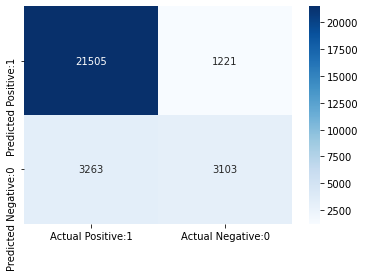

In [81]:
#Let's visualize the confusion matrix using heatmap
matrix = pd.DataFrame(data=cm,index=['Predicted Positive:1','Predicted Negative:0'],
                      columns=['Actual Positive:1','Actual Negative:0'])
sns.heatmap(matrix,annot=True,fmt='d',cmap='Blues')

In [82]:
#Let's get a detailed report using classification_report
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_log_reg))

              precision    recall  f1-score   support

         0.0       0.87      0.95      0.91     22726
         1.0       0.72      0.49      0.58      6366

    accuracy                           0.85     29092
   macro avg       0.79      0.72      0.74     29092
weighted avg       0.84      0.85      0.83     29092



Now we can see that our model is performing quite well. We should try and reduce the False Negatives and False Positives. The model is doing a fine job at predicting the day it did not rain. But predicting the day it rained can see some room for improvement.

In [83]:
TP = cm[0,0]
FP = cm[0,1]
FN = cm[1,0]
TN = cm[1,1]

In [84]:
#True Positive Rate/Recall/Sensitivity i.e proportion of correctly predicted actual values
TPR = (TP)/(TP+FN)
print('TPR:',TPR)

TPR: 0.8682574289405685


In [85]:
#False Positive Rate 
FPR = (FP)/(FP+TN)
print('FPR:',FPR)

FPR: 0.28237742830712304


In [86]:
#Precision i.e proportion of correctly predicted positive values out of the total predicted positive values
Precision = TP/(TP+FP)
print('Precision:',Precision)

Precision: 0.9462729912875121


In [87]:
#True Negative Rate/Specificity
TNR = TN/(FP+TN)
print('TNR:',TNR)

TNR: 0.717622571692877


In [88]:
#False Negative Rate
FNR = FN/(FN+TP)
print('FNR:',FNR)

FNR: 0.13174257105943152


In [89]:
#Classification error
classification_error = (FP+FN)/(TP+FP+TN+FN)
print('Classification Error:',classification_error)

Classification Error: 0.15413172006049772


In [90]:
#We can adjust the treshold level of from the default of 0.5
#Let's predict the first 10 probabilities of 2 outcomes (1 and 0) 
y_pred_prob = log_reg.predict_proba(X_test)[:10]
y_pred_prob

array([[0.81237435, 0.18762565],
       [0.81326657, 0.18673343],
       [0.80929277, 0.19070723],
       [0.64257374, 0.35742626],
       [0.91751829, 0.08248171],
       [0.95585133, 0.04414867],
       [0.46002097, 0.53997903],
       [0.58249151, 0.41750849],
       [0.8501736 , 0.1498264 ],
       [0.68032364, 0.31967636]])

Each array gives the probability of the 2 outcomes (Rain will occur and Rain will not occur), their sum being equal to 1. By default the classification threshold value is 0.5,The model will classify that rain would occur predicted probability is greater than 0.5 and rain would not occur if predicted probability is less than 0.5

In [91]:
y_pred_prob_df = pd.DataFrame(data=y_pred_prob,columns=['Probability of No Rain (0)','Probability of Rain (1)'])
y_pred_prob_df

,Probability of No Rain (0),Probability of Rain (1)
0,0.812374,0.187626
1,0.813267,0.186733
2,0.809293,0.190707
3,0.642574,0.357426
4,0.917518,0.082482
5,0.955851,0.044149
6,0.460021,0.539979
7,0.582492,0.417508
8,0.850174,0.149826
9,0.680324,0.319676


In [92]:
#Let's predict the first 10 probabilities for (1) i.e Probability of Rain
y_pred_rain = log_reg.predict_proba(X_test)[:10,1]
y_pred_rain

array([0.18762565, 0.18673343, 0.19070723, 0.35742626, 0.08248171,
       0.04414867, 0.53997903, 0.41750849, 0.1498264 , 0.31967636])

From this we can see that only 1 observation with probability (0.5399) would result in classifying that there will be rain tomorrow i.e very few observations have probability greater than 0.5. We can tweak this by lowering the treshold value

Now, let's plot the ROC curve which basically tells the performance of our model at various classification thresholds

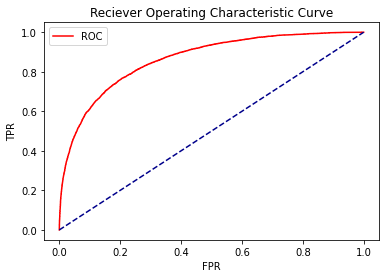

In [93]:
from sklearn.metrics import roc_curve
y_pred1 = log_reg.predict_proba(X_test)[:,1]
y_pred1 = y_pred1.reshape(-1,1)
fpr,tpr,thresholds = roc_curve(y_test,y_pred1)
plt.plot(fpr,tpr,color='red',label='ROC')
plt.plot([0,1],[0,1],color='darkblue',linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('Reciever Operating Characteristic Curve')
plt.legend()
plt.show()

Depending on the problem statement, threshold level can be adjusted with the help of ROC curve

In [94]:
#Now let's compute the ROC-AUC score. The more area covered under the curve, the better the model is.
from sklearn.metrics import roc_auc_score
roc_auc = roc_auc_score(y_test,y_pred1)
print('ROC-AUC:',roc_auc)

ROC-AUC: 0.8630189743657376


In [95]:
#Let's calculate cross-validated roc_auc_score
cv_roc_auc = cross_val_score(log_reg,X_train,y_train,cv=10,scoring='roc_auc').mean()
print('Cross-Validated ROC-AUC for Logistic Regression:',cv_roc_auc)

Cross-Validated ROC-AUC for Logistic Regression: 0.8632025356154545


Let's try to implement some other models and see which performs the best

### 4.2 KNN, DecisionTree, RandomForest, XgBoost

In [96]:
#First let's define a function to plot ROC Curve
def plot_roc(fpr,tpr):
    plt.plot(fpr,tpr,color='red',label='ROC')
    plt.plot([0,1],[0,1],color='darkblue',linestyle='--')
    plt.title('Reciever Operating Characteristic Curve')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend()
    plt.show()

In [97]:
def build_model(model,X_train,y_train,X_test,y_test,verbose=True):
    start_time = time.time()
    if verbose==False:
        model.fit(X_train,y_train,verbose=0)
    else:
        model.fit(X_train,y_train)
        
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test,y_pred)
    mean_training_accuracy = cross_val_score(model,X_train,y_train,cv=10,scoring='accuracy').mean()
    mean_testing_accuracy = cross_val_score(model,X_test,y_test,cv=10,scoring='accuracy').mean()
    cm = confusion_matrix(y_test,y_pred)
    print('Confusion Matrix',cm,'\n')
    print('True Positives (TP):',cm[0,0])
    print('False Positives (FP):',cm[0,1])
    print('False Negatives (FN):',cm[1,0])
    print('True Negatives (TN):',cm[1,1])
    matrix = pd.DataFrame(data=cm,index=['Predicted Positive:1','Predicted Negative:0'],
                      columns=['Actual Positive:1','Actual Negative:0'])
    sns.heatmap(matrix,annot=True,fmt='d',cmap='Blues')
    plt.show()
    
    print(classification_report(y_test,y_pred))
    TP = cm[0,0]
    FP = cm[0,1]
    FN = cm[1,0]
    TN = cm[1,1]
    
    TPR = (TP)/(TP+FN)
    print('TPR:',TPR)
    FPR = (FP)/(FP+TN)
    print('FPR:',FPR)
    Precision = TP/(TP+FP)
    print('Precision:',Precision)
    TNR = TN/(FP+TN)
    print('TNR:',TNR)
    FNR = FN/(FN+TP)
    print('FNR:',FNR)
    classification_error = (FP+FN)/(TP+FP+TN+FN)
    print('Classification Error:',classification_error)
    
    roc_auc = roc_auc_score(y_test,y_pred)
    print('ROC-AUC:',roc_auc)
    cv_roc_auc = cross_val_score(model,X_train,y_train,cv=10,scoring='roc_auc').mean()
    print('Cross-Validated ROC-AUC:',cv_roc_auc)
    y_pred1 = model.predict_proba(X_test)[:,1]
    y_pred1 = y_pred1.reshape(-1,1)
    fpr,tpr,thresholds = roc_curve(y_test,y_pred1)
    plot_roc(fpr,tpr)
    stop_time = time.time()
    time_taken = stop_time-start_time
    print(time_taken)
    return model,time_taken

#### 4.2.1 K-Nearest Neighbors (KNN)

Confusion Matrix [[21149  1577]
 [ 4142  2224]] 

True Positives (TP): 21149
False Positives (FP): 1577
False Negatives (FN): 4142
True Negatives (TN): 2224


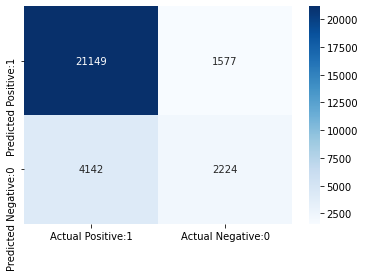

              precision    recall  f1-score   support

         0.0       0.84      0.93      0.88     22726
         1.0       0.59      0.35      0.44      6366

    accuracy                           0.80     29092
   macro avg       0.71      0.64      0.66     29092
weighted avg       0.78      0.80      0.78     29092

TPR: 0.836226325570361
FPR: 0.4148908182057353
Precision: 0.930608114054387
TNR: 0.5851091817942646
FNR: 0.163773674429639
Classification Error: 0.1965832531280077
ROC-AUC: 0.6399820337786858
Cross-Validated ROC-AUC: 0.7428242464578669


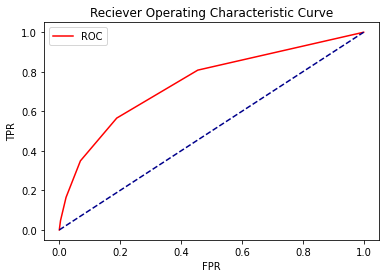

1029.589443206787


In [98]:
from sklearn.neighbors import KNeighborsClassifier
parameters = {'n_neighbors':5}
knn_model = KNeighborsClassifier(**parameters)
knn_model,time_taken = build_model(knn_model,X_train,y_train,X_test,y_test)

### 4.2.2 DecisionTree

Confusion Matrix [[19351  3375]
 [ 3111  3255]] 

True Positives (TP): 19351
False Positives (FP): 3375
False Negatives (FN): 3111
True Negatives (TN): 3255


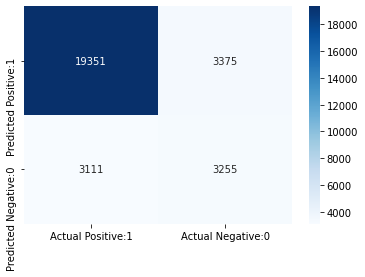

              precision    recall  f1-score   support

         0.0       0.86      0.85      0.86     22726
         1.0       0.49      0.51      0.50      6366

    accuracy                           0.78     29092
   macro avg       0.68      0.68      0.68     29092
weighted avg       0.78      0.78      0.78     29092

TPR: 0.861499421244769
FPR: 0.5090497737556561
Precision: 0.851491683534278
TNR: 0.49095022624434387
FNR: 0.13850057875523106
Classification Error: 0.22294788945414548
ROC-AUC: 0.681400884179957
Cross-Validated ROC-AUC: 0.6930234871469508


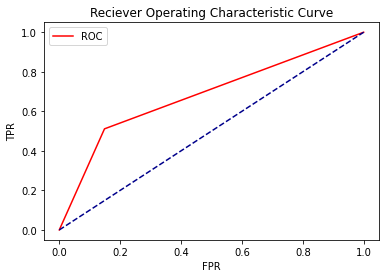

92.66832971572876


In [99]:
from sklearn.tree import DecisionTreeClassifier
DT_model = DecisionTreeClassifier()
DT_model,time_taken = build_model(DT_model,X_train,y_train,X_test,y_test)

### 4.2.3 RandomForest

Confusion Matrix [[21898   828]
 [ 3443  2923]] 

True Positives (TP): 21898
False Positives (FP): 828
False Negatives (FN): 3443
True Negatives (TN): 2923


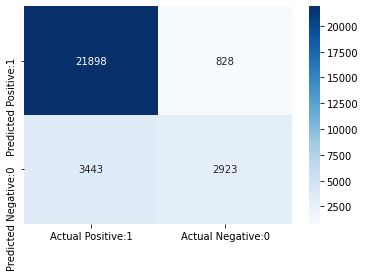

              precision    recall  f1-score   support

         0.0       0.86      0.96      0.91     22726
         1.0       0.78      0.46      0.58      6366

    accuracy                           0.85     29092
   macro avg       0.82      0.71      0.74     29092
weighted avg       0.85      0.85      0.84     29092

TPR: 0.8641332228404561
FPR: 0.22074113569714743
Precision: 0.9635659596937428
TNR: 0.7792588643028526
FNR: 0.13586677715954382
Classification Error: 0.14681011962051424
ROC-AUC: 0.7113619933561395
Cross-Validated ROC-AUC: 0.8789107890203434


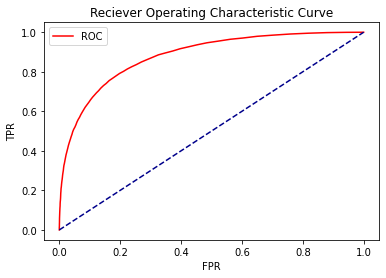

731.6592361927032


In [100]:
from sklearn.ensemble import RandomForestClassifier
rf_model = RandomForestClassifier()
rf_model,time_taken = build_model(rf_model,X_train_ensemble,y_train,X_test_ensemble,y_test)

### 4.2.4 XgBoost

[02:48:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:49:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:49:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:49:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

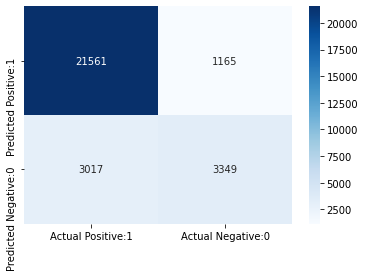

              precision    recall  f1-score   support

         0.0       0.88      0.95      0.91     22726
         1.0       0.74      0.53      0.62      6366

    accuracy                           0.86     29092
   macro avg       0.81      0.74      0.76     29092
weighted avg       0.85      0.86      0.85     29092

TPR: 0.8772479453169502
FPR: 0.25808595480726626
Precision: 0.9487371292792396
TNR: 0.7419140451927337
FNR: 0.12275205468304988
Classification Error: 0.14375085934277465
ROC-AUC: 0.7374065790913947
[02:53:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[02:53:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used w

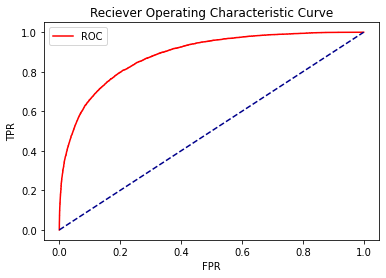

453.3638205528259


In [101]:
import xgboost as xgb
xgb_model = xgb.XGBClassifier()
xgb_model,time_taken = build_model(xgb_model,X_train_ensemble,y_train,X_test_ensemble,y_test)

We'll select RandomForest as it has fast execution time, although XgBoost performs slightly better!

## 5. Hyperparameter Optimization

In [102]:
rf_model

RandomForestClassifier()

In [103]:
#Hyperparameter Optimization using RandomizedSearchCV

#Number of trees in the model
n_estimators = [int(x) for x in np.linspace(start=100,stop=1200,num=12)]

#Number of features to consider at every split
max_features = ['auto','sqrt']

#Maximum number of levels in a tree
max_depth = [int(x) for x in np.linspace(start=5,stop=30,num=6)]

#Minimum number of samples required to split a node
min_samples_split = [2,5,10,15,100]

#Minimum number of samples required at each leaf node
min_samples_leaf = [1,2,5,10]

#Define the grid of hyperparameters to search
hyperparameter_grid = {'n_estimators':n_estimators,
                       'max_features':max_features,
                       'max_depth':max_depth,
                       'min_samples_split':min_samples_split,
                       'min_samples_leaf':min_samples_leaf,
                      }
print(hyperparameter_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'max_features': ['auto', 'sqrt'], 'max_depth': [5, 10, 15, 20, 25, 30], 'min_samples_split': [2, 5, 10, 15, 100], 'min_samples_leaf': [1, 2, 5, 10]}


In [104]:
from sklearn.model_selection import RandomizedSearchCV
rf_random = RandomizedSearchCV(estimator=rf_model,
                               param_distributions=hyperparameter_grid,
                               scoring='accuracy',
                               n_iter=10,
                               cv=5,
                               verbose=2,
                               n_jobs=1
                               )

In [105]:
rf_random.fit(X_train_ensemble,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=20, max_features=auto, min_samples_leaf=10, min_samples_split=100, n_estimators=200; total time=  36.5s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=10, min_samples_split=100, n_estimators=200; total time=  35.8s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=10, min_samples_split=100, n_estimators=200; total time=  36.3s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=10, min_samples_split=100, n_estimators=200; total time=  35.8s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=10, min_samples_split=100, n_estimators=200; total time=  36.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=100, n_estimators=100; total time=  20.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=100, n_estimators=100; total time=  20.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=1,
                   param_distributions={'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   scoring='accuracy', verbose=2)

In [106]:
print(rf_random.best_params_)

{'n_estimators': 700, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 25}


In [107]:
print(rf_random.best_estimator_)

RandomForestClassifier(max_depth=25, min_samples_leaf=2, n_estimators=700)


In [108]:
print(rf_random.best_score_)

0.8538859351127194


In [109]:
#RandomizedSearchCV score on test set
print('RandomizedSearchCV score on test set:',rf_random.score(X_test_ensemble,y_test))

RandomizedSearchCV score on test set: 0.8516774370961089


In [110]:
#Let's revisit our confusion matrix 
rf_pred = rf_random.predict(X_test_ensemble)
cm = confusion_matrix(y_test,rf_pred)
print('Confusion Matrix',cm,'\n')
print('True Positives (TP):',cm[0,0])
print('False Positives (FP):',cm[0,1])
print('False Negatives (FN):',cm[1,0])
print('True Negatives (TN):',cm[1,1])

Confusion Matrix [[21926   800]
 [ 3515  2851]] 

True Positives (TP): 21926
False Positives (FP): 800
False Negatives (FN): 3515
True Negatives (TN): 2851


In [111]:
print('Classification Report:','\n',classification_report(y_test,rf_pred))

Classification Report: 
               precision    recall  f1-score   support

         0.0       0.86      0.96      0.91     22726
         1.0       0.78      0.45      0.57      6366

    accuracy                           0.85     29092
   macro avg       0.82      0.71      0.74     29092
weighted avg       0.84      0.85      0.84     29092



<AxesSubplot:>

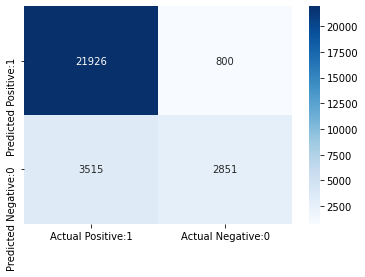

In [112]:
matrix = pd.DataFrame(data=cm,index=['Predicted Positive:1','Predicted Negative:0'],
                      columns=['Actual Positive:1','Actual Negative:0'])
sns.heatmap(matrix,annot=True,fmt='d',cmap='Blues')

**Observations:**
* False Negatives have increased slightly from 3443 to 3515
* False Positives have decreased slightly from 828 to 800 
* True Positives have increased slightly from 21898 to 21926
* True Negatives have decreased from 2923 to 2851

**Classification Error:**(3515+800)/(21926+800+3515+2851) = 0.148

We'll finally use our optimized RandomForest model for deployment!

## 6. Pickle File

In [114]:
#Write to disk to use the model any number of times
import pickle
file = open('rain.pkl','wb')
pickle.dump(rf_random,file)
file.close()

In [115]:
loaded_model = pickle.load(open('rain.pkl','rb'))
final_pred = loaded_model.predict(X_test_ensemble)